In [1]:
# Run this cell to mount your Google Drive.

from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


# Imports

In [2]:
# path
pth = '/content/drive/MyDrive/Colab Notebooks/Thesis'

%cd /content/drive/My Drive/Colab Notebooks/Thesis/SupervisedLearning

from train import *
from visualize_data import *
from utils import *

%cd /content/drive/My Drive/Colab Notebooks/Thesis

/content/drive/My Drive/Colab Notebooks/Thesis/SupervisedLearning
/content/drive/My Drive/Colab Notebooks/Thesis


# State-Action Pair Guideline

Specify the desired state-action pair:

i.e. Before Pickup, Before Discard: Draw (bpbd_draw)

## Model Name Guideline

Specify the following parameters:

- **Data Selection**:
 - **`state-action pair`**
   - possible state-action pairs
```r
state_action_pair = {'all': 'all', # all actions
                    'bpbd': 'draw', # actions 2/3 
                    'apbd': ['discard', 'knock'], # actions 6-57, 58-109
                    'apad': 'knock_bin'}
```
 - **`model_name`**
   - name of the model based on **pruned states** and **chosen action**
 - **`numGames`**
   - Number of games used to train model
$$numGames \in [2000, 6000, 8000]$$

 - **`pruneStatesList`**
   - which states to omit when training model 
 ```r
 pruneStatesList is a list, {'currHand','topCard','deadCard','oppCard','unknownCard'}
 ```
 - **`actionChoice`**
   - which specific action to train model 
```r
actionChoice is one of {'all','draw','discard','knock'}
```
 - **`balance`** (T/F, **`default = False`**)
   - balance data by smallest class

--- 

- **Model Parameters**:

| Parameter         | Type            |Default|
| ----------------- |:---------------:| -----:|
| **batch_size**    | int             | 1000  |
| **learning_rate** | float           | 0.001 |
| **epoch**         | int             | 100   |
| **pre_train**     | bool (T/F)      | False |
| **model_PT**      | str (model/path)| null  |
| **device**        | str (cpu/cuda)  | cpu   |

# After Pickup, After Discard: Knock - Binary (apad_knock_bin)

## all_states_all_actions

### Parameters

In [3]:
# state_action pair
state = 'apad'
action = 'knock_bin'

# model name
model_name = 'all_states_all_actions'

# Number of Games
numGames = 8000

# prunable states
# {'currHand','topCard','deadCard','oppCard','unknownCard'} or blank if None
pruneStatesList = []

# choosable actions
# {'all','draw_pickup','discard','knock','knock_bin'}
actionChoice = 'knock_bin'

# Balance classes
balance = False

# Training parameters
batch_size = 1000
lr = 0.001
epochs = 100

# Pretrain model
pre_train = False
model_PT = ''

# device for model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

### Create Directories

In [4]:
data_pth, model_pth, plot_pth = create_dir(pth, state, action, model_name)

### Load, Prune, and Split Training Data

loading 8000 games dataset from /content/drive/MyDrive/Colab Notebooks/Thesis/data/apad/knock_bin


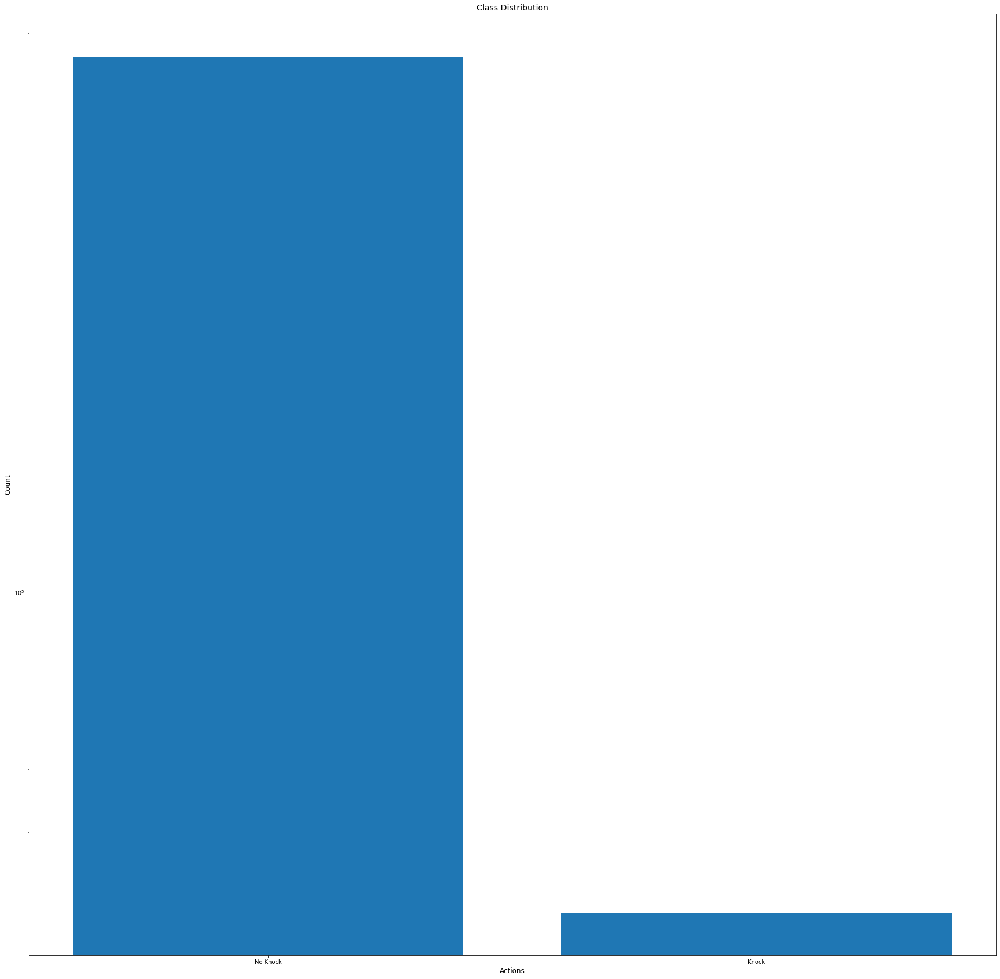

In [5]:
train_loader, val_loader, classes = load_train_data(data_pth, plot_pth,
                                                    numGames, batch_size, 
                                                    state, action, 
                                                    pruneStatesList, actionChoice, 
                                                    balance, visualize=True)

### Train Model

Epoch: 1 | Train Loss: 0.06575753 | Train acc: 0.921881
              Val Loss: 0.05392385 |   Val acc: 0.926106
Epoch: 2 | Train Loss: 0.04935986 | Train acc: 0.934516
              Val Loss: 0.04728786 |   Val acc: 0.937273
Epoch: 3 | Train Loss: 0.04719078 | Train acc: 0.938021
              Val Loss: 0.04690524 |   Val acc: 0.937595
Epoch: 4 | Train Loss: 0.04695308 | Train acc: 0.938179
              Val Loss: 0.04663231 |   Val acc: 0.938370
Epoch: 5 | Train Loss: 0.04686580 | Train acc: 0.938331
              Val Loss: 0.04686661 |   Val acc: 0.937260
Epoch: 6 | Train Loss: 0.04673472 | Train acc: 0.938342
              Val Loss: 0.04681015 |   Val acc: 0.938574
Epoch: 7 | Train Loss: 0.04670590 | Train acc: 0.938463
              Val Loss: 0.04638948 |   Val acc: 0.938416
Epoch: 8 | Train Loss: 0.04647232 | Train acc: 0.938632
              Val Loss: 0.04624322 |   Val acc: 0.938922
Epoch: 9 | Train Loss: 0.04633040 | Train acc: 0.938934
              Val Loss: 0.04628680 |   V

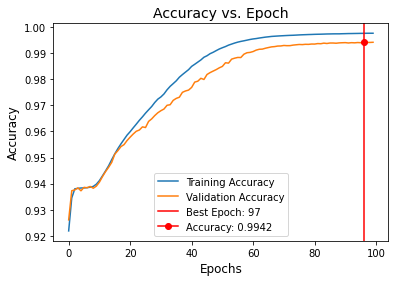

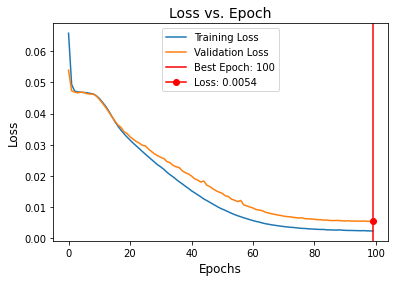

In [6]:
model, model_acc, model_loss = train(train_loader, val_loader, plot_pth, batch_size, lr, epochs, verbose=True, pre_train=pre_train, model_PT=model_PT, device=device)
torch.save(model, '{}/model.pt'.format(model_pth))
torch.save(model_acc, '{}/model_acc.pt'.format(model_pth))
torch.save(model_loss, '{}/model_loss.pt'.format(model_pth))

#### Confusion Matrix

##### Load Models

In [7]:
model = torch.load('{}/model.pt'.format(model_pth), map_location=device)
model_acc = torch.load('{}/model_acc.pt'.format(model_pth), map_location=device)
model_loss = torch.load('{}/model_loss.pt'.format(model_pth), map_location=device)

##### Train Set

Accuracy: 99.76
Normalized confusion matrix


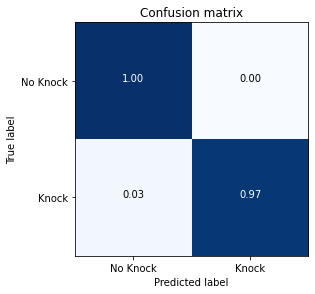

Confusion matrix, without normalization


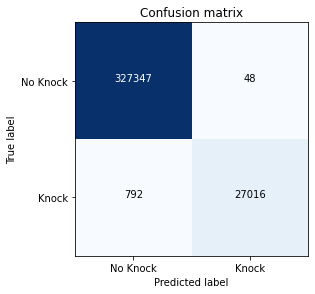

In [8]:
currGames = 8000
plot_cm(plot_pth, classes, model, train_loader, device, numGames=currGames)

##### Validation Set

Accuracy: 99.42
Normalized confusion matrix


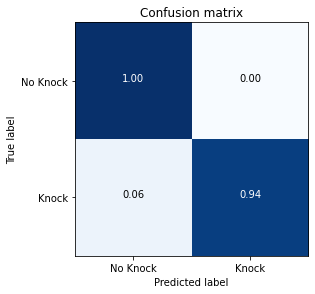

Confusion matrix, without normalization


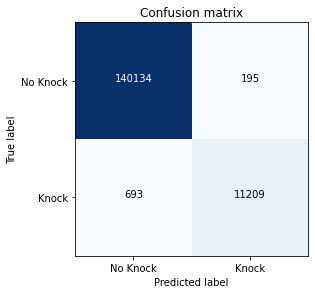

In [9]:
currGames = 8000
plot_cm(plot_pth, classes, model, val_loader, device, numGames=currGames, mode='val')

##### Test Set (6k)

loading 6000 games dataset from /content/drive/MyDrive/Colab Notebooks/Thesis/data/apad/knock_bin
Accuracy: 99.66
Normalized confusion matrix


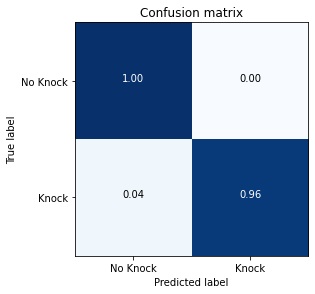

Confusion matrix, without normalization


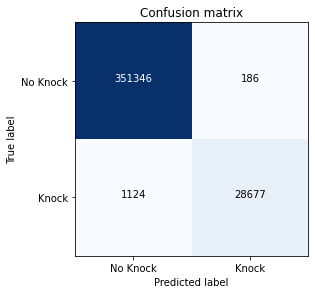

In [10]:
currGames = 6000
test_loader_6k, classes = load_test_data(data_pth, currGames, state, action,
                                         pruneStatesList, actionChoice)
plot_cm(plot_pth, classes, model, test_loader_6k, device, numGames=currGames)

##### Test Set (2k)

Test on all three models generated:

In [11]:
currGames = 2000
test_loader_2k, classes = load_test_data(data_pth, currGames, state, action,
                                         pruneStatesList, actionChoice)

loading 2000 games dataset from /content/drive/MyDrive/Colab Notebooks/Thesis/data/apad/knock_bin


###### all epoch

Accuracy: 96.47
Normalized confusion matrix


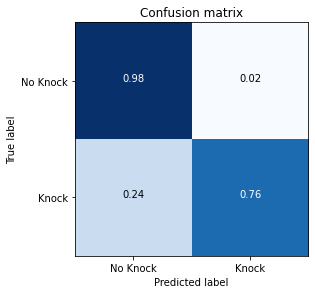

Confusion matrix, without normalization


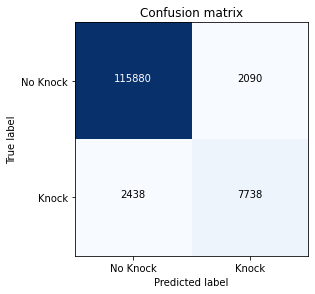

In [12]:
plot_cm(plot_pth, classes, model, test_loader_2k, device, numGames=currGames)

###### max validation accuracy

Accuracy: 96.44
Normalized confusion matrix


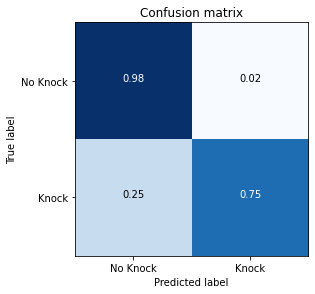

Confusion matrix, without normalization


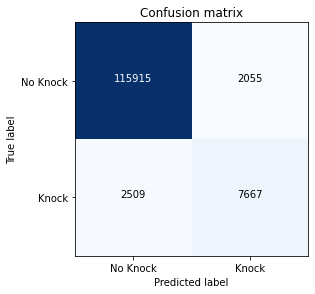

In [13]:
plot_cm(plot_pth, classes, model_acc, test_loader_2k, device, numGames=currGames, mode='acc')

###### min validation loss

Accuracy: 96.47
Normalized confusion matrix


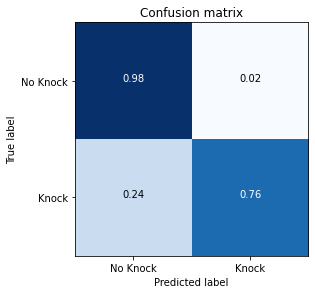

Confusion matrix, without normalization


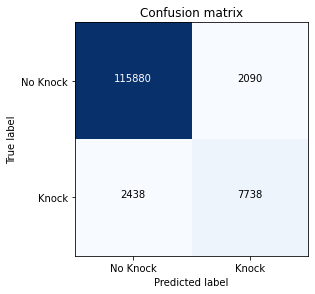

In [14]:
plot_cm(plot_pth, classes, model_loss, test_loader_2k, device, numGames=currGames, mode='loss')

# After Pickup, Before Discard: Knock (apbd_knock)

## all_states_knock_only

### Parameters

In [15]:
# state_action pair
state = 'apbd'
action = 'knock'

# model name
model_name = 'all_states_knock_only'

# Number of Games
numGames = 8000

# prunable states
# {'currHand','topCard','deadCard','oppCard','unknownCard'} or blank if None
pruneStatesList = []

# choosable actions
# {'all','draw_pickup','discard','knock','knock_bin'}
actionChoice = 'knock'

# Balance classes
balance = False

# Training parameters
batch_size = 1000
lr = 0.001
epochs = 500

# Pretrain model
pre_train = False
model_PT = ''

# device for model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

### Create Directories

In [16]:
data_pth, model_pth, plot_pth = create_dir(pth, state, action, model_name)

### Load, Prune, and Split Training Data

loading 8000 games dataset from /content/drive/MyDrive/Colab Notebooks/Thesis/data/apbd/knock


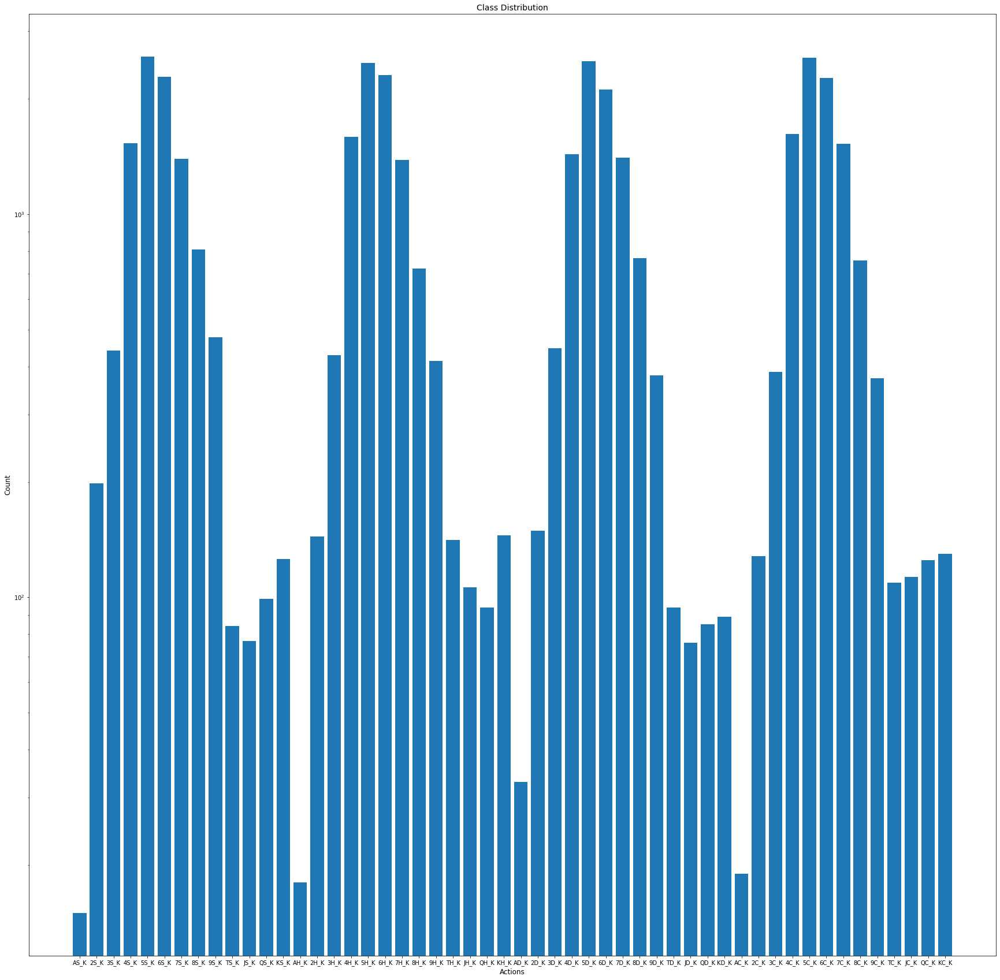

In [17]:
train_loader, val_loader, classes = load_train_data(data_pth, plot_pth,
                                                    numGames, batch_size, 
                                                    state, action, 
                                                    pruneStatesList, actionChoice, 
                                                    balance, visualize=True)

### Train Model

Epoch: 1 | Train Loss: 0.04426062 | Train acc: 0.032246
              Val Loss: 0.01884510 |   Val acc: 0.079011
Epoch: 2 | Train Loss: 0.01887074 | Train acc: 0.069305
              Val Loss: 0.01885434 |   Val acc: 0.063762
Epoch: 3 | Train Loss: 0.01879915 | Train acc: 0.064565
              Val Loss: 0.01871704 |   Val acc: 0.063846
Epoch: 4 | Train Loss: 0.01862810 | Train acc: 0.064601
              Val Loss: 0.01852972 |   Val acc: 0.063846
Epoch: 5 | Train Loss: 0.01848453 | Train acc: 0.076594
              Val Loss: 0.01843403 |   Val acc: 0.116380
Epoch: 6 | Train Loss: 0.01841797 | Train acc: 0.138825
              Val Loss: 0.01838678 |   Val acc: 0.133724
Epoch: 7 | Train Loss: 0.01838061 | Train acc: 0.150819
              Val Loss: 0.01835445 |   Val acc: 0.178383
Epoch: 8 | Train Loss: 0.01835295 | Train acc: 0.192653
              Val Loss: 0.01832809 |   Val acc: 0.196313
Epoch: 9 | Train Loss: 0.01832694 | Train acc: 0.196172
              Val Loss: 0.01830080 |   V

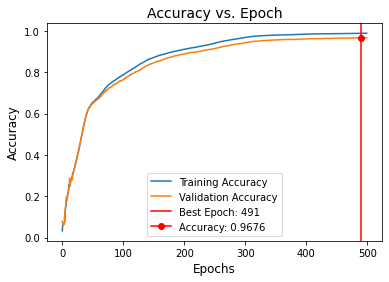

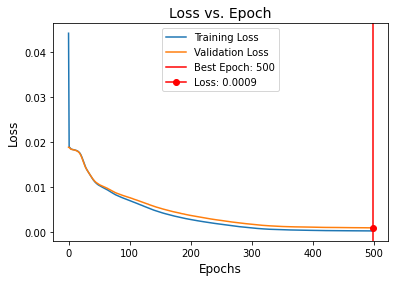

In [18]:
model, model_acc, model_loss = train(train_loader, val_loader, plot_pth, batch_size, lr, epochs, verbose=True, pre_train=pre_train, model_PT=model_PT, device=device)
torch.save(model, '{}/model.pt'.format(model_pth))
torch.save(model_acc, '{}/model_acc.pt'.format(model_pth))
torch.save(model_loss, '{}/model_loss.pt'.format(model_pth))

#### Confusion Matrix

##### Load Models

In [19]:
model = torch.load('{}/model.pt'.format(model_pth), map_location=device)
model_acc = torch.load('{}/model_acc.pt'.format(model_pth), map_location=device)
model_loss = torch.load('{}/model_loss.pt'.format(model_pth), map_location=device)

##### Train Set

Accuracy: 98.92
Normalized confusion matrix


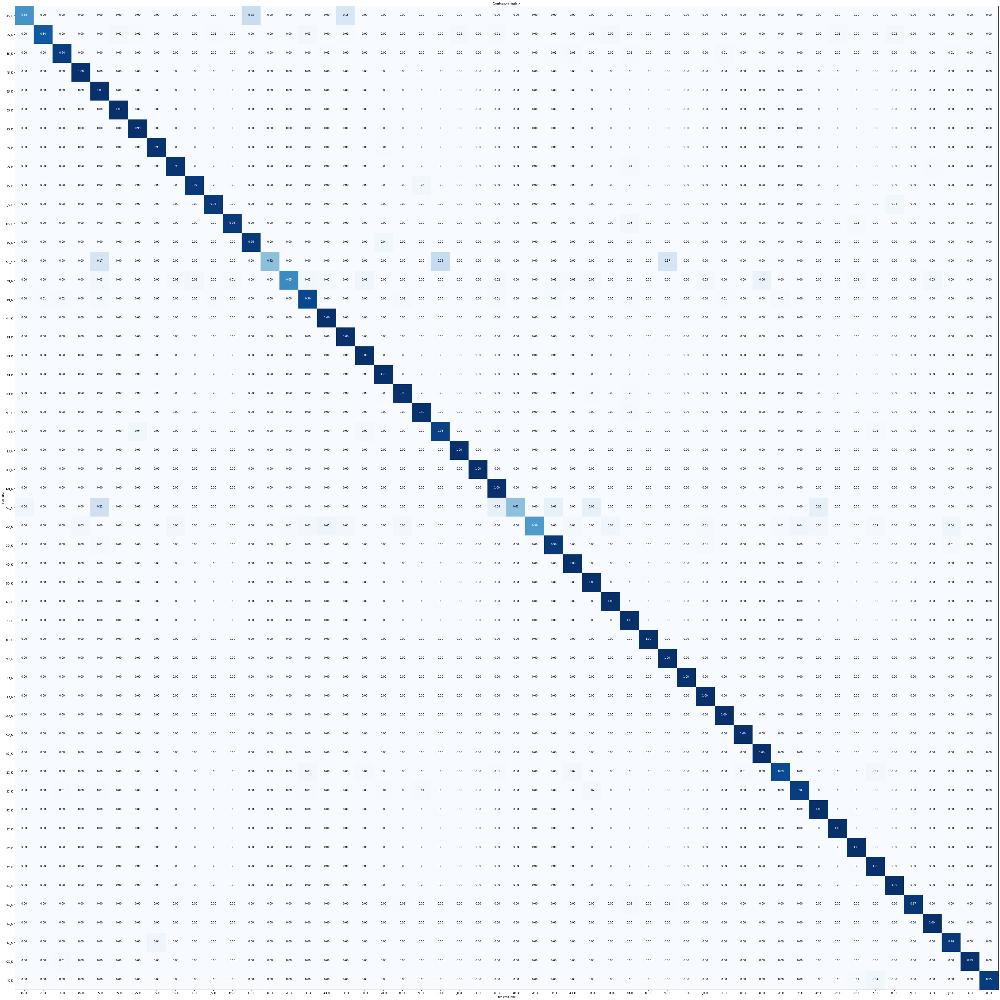

Confusion matrix, without normalization


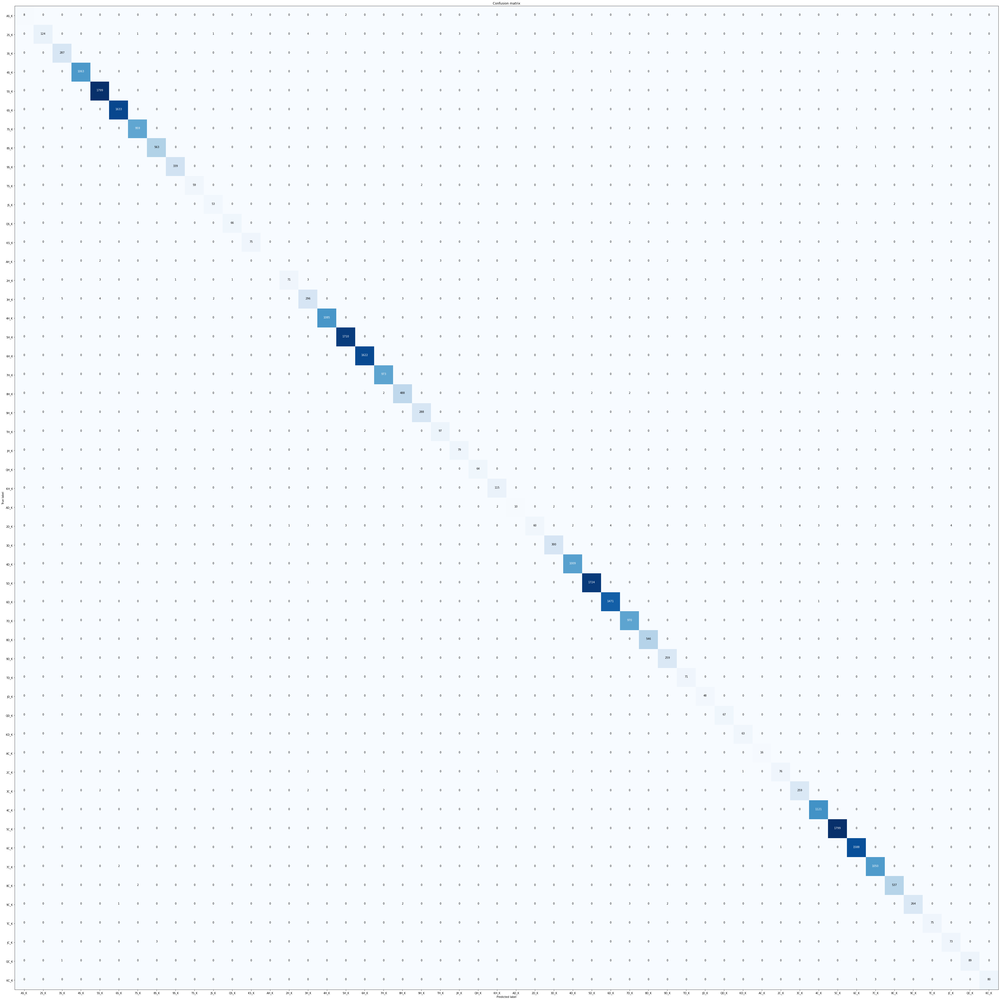

In [20]:
currGames = 8000
plot_cm(plot_pth, classes, model, train_loader, device, numGames=currGames)

##### Validation Set

Accuracy: 96.69
Normalized confusion matrix


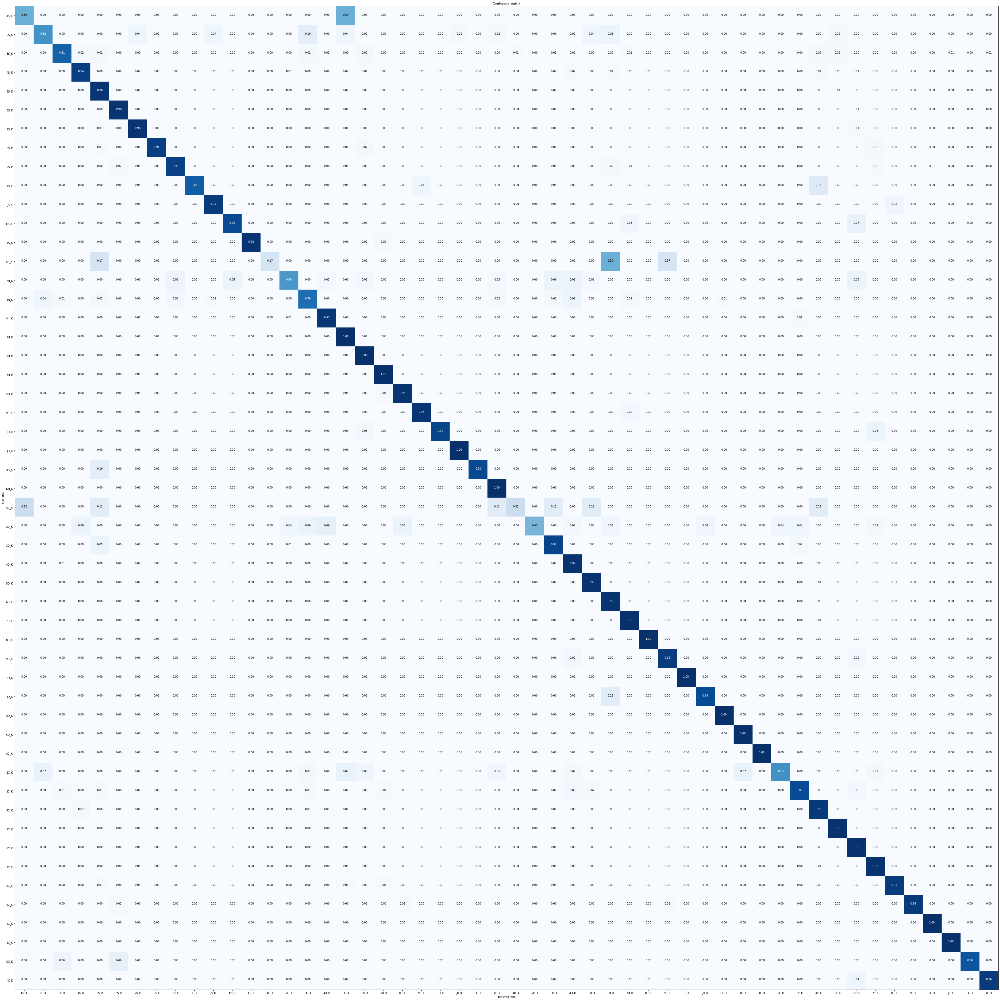

Confusion matrix, without normalization


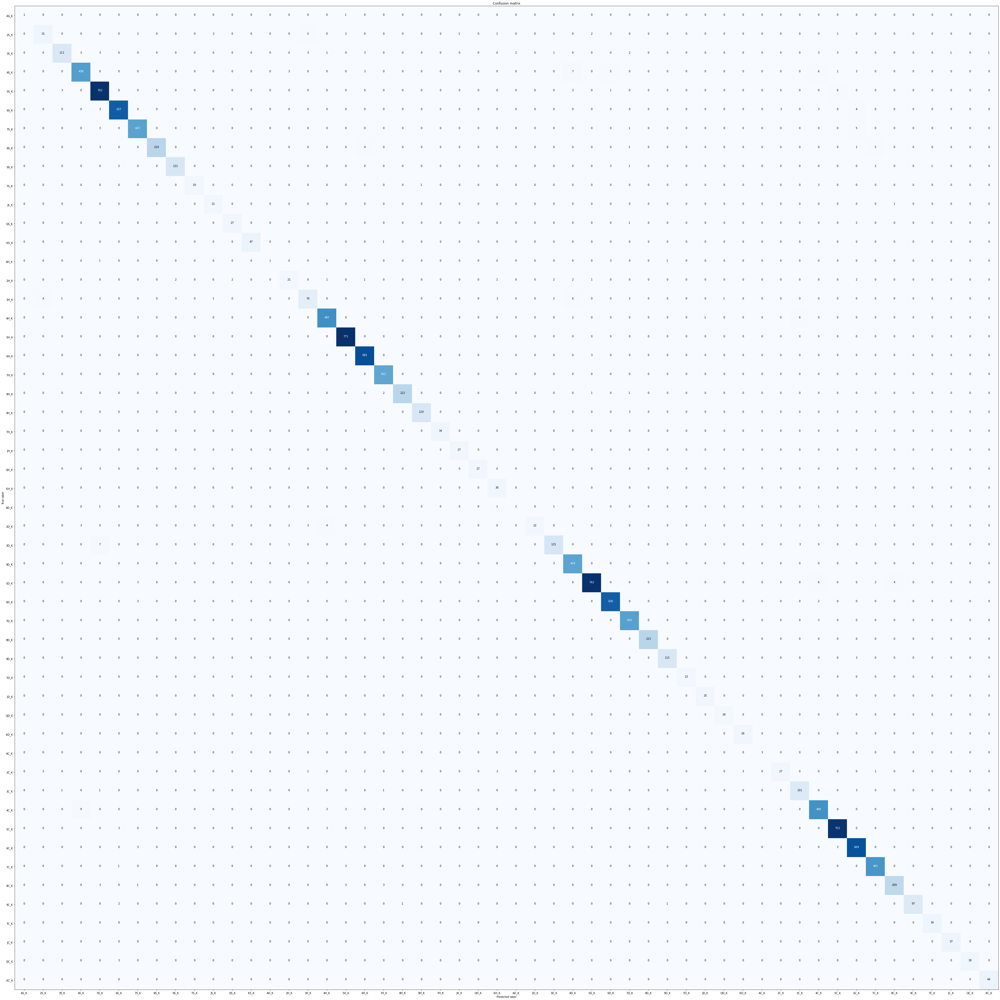

In [21]:
currGames = 8000
plot_cm(plot_pth, classes, model, val_loader, device, numGames=currGames, mode='val')

##### Test Set (6k)

loading 6000 games dataset from /content/drive/MyDrive/Colab Notebooks/Thesis/data/apbd/knock
Accuracy: 98.21
Normalized confusion matrix


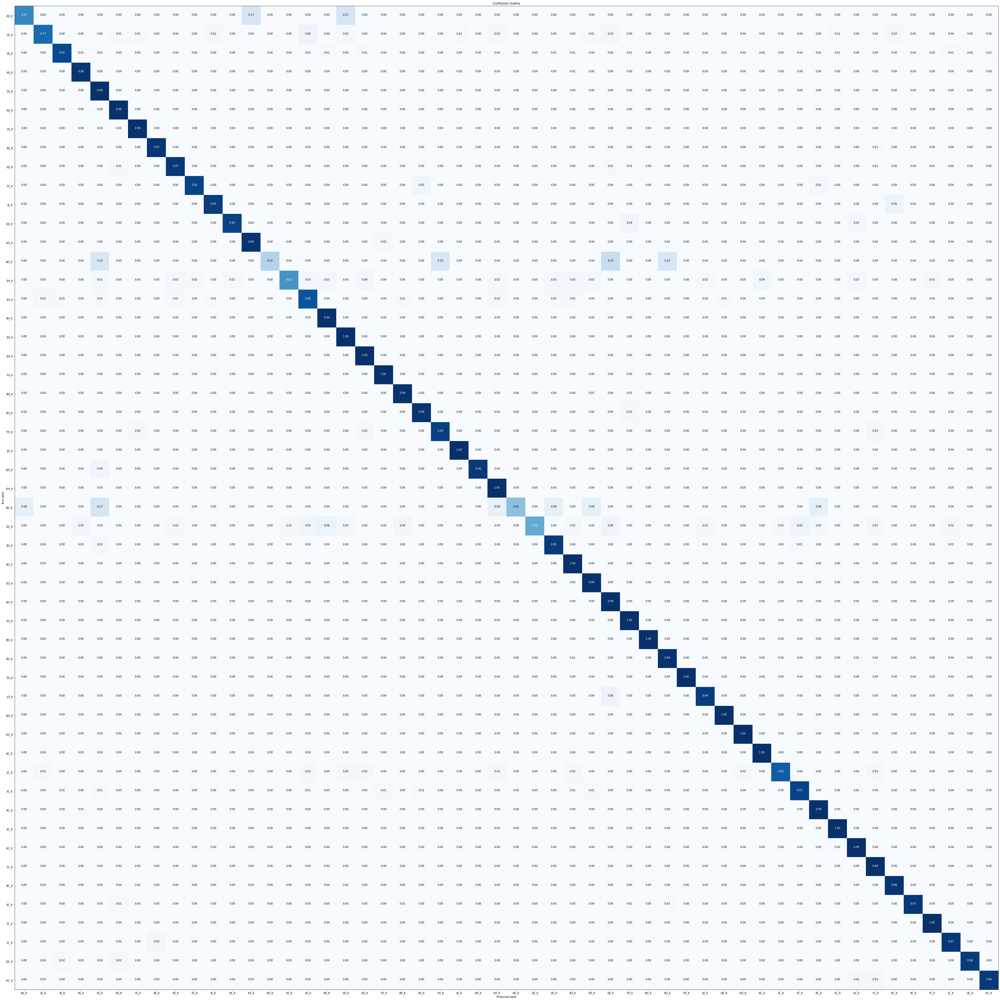

Confusion matrix, without normalization


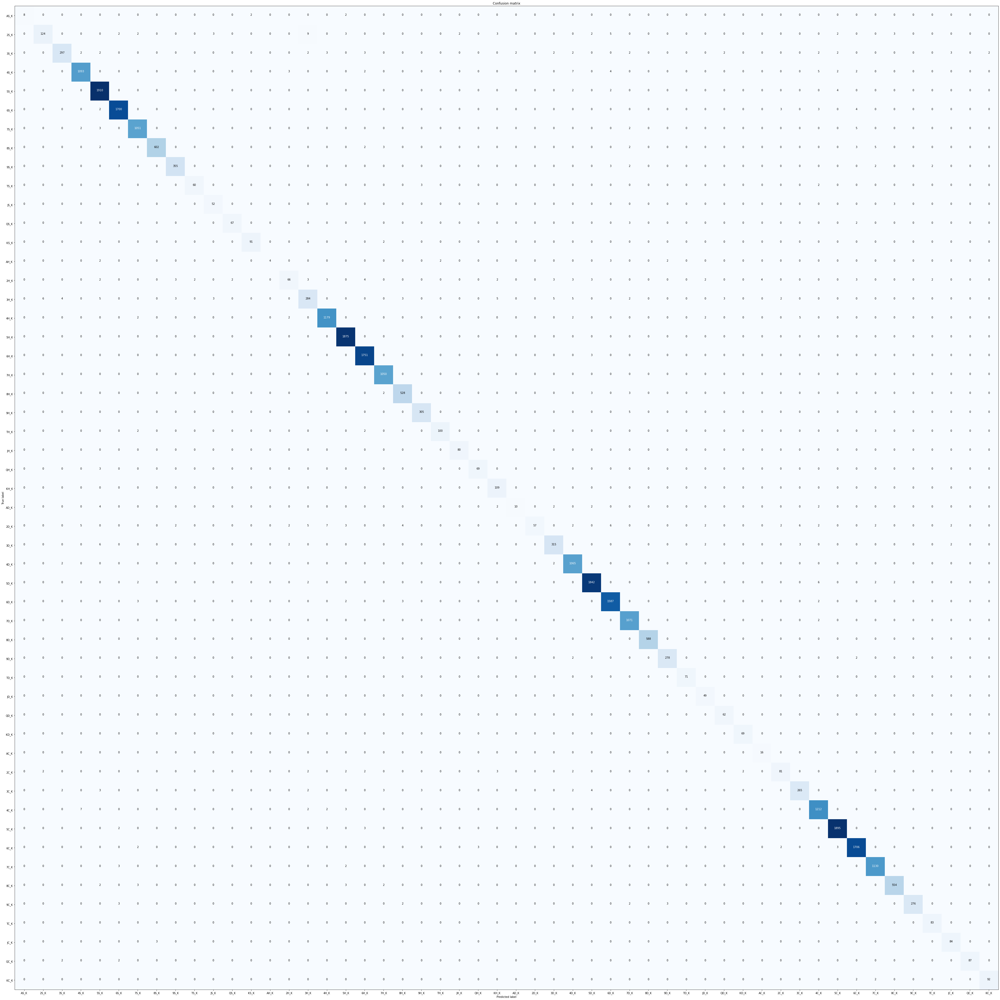

In [22]:
currGames = 6000
test_loader_6k, classes = load_test_data(data_pth, currGames, state, action,
                                         pruneStatesList, actionChoice)
plot_cm(plot_pth, classes, model, test_loader_6k, device, numGames=currGames)

##### Test Set (2k)

Test on all three models generated:

In [23]:
currGames = 2000
test_loader_2k, classes = load_test_data(data_pth, currGames, state, action,
                                         pruneStatesList, actionChoice)

loading 2000 games dataset from /content/drive/MyDrive/Colab Notebooks/Thesis/data/apbd/knock


###### all epoch

Accuracy: 98.25
Normalized confusion matrix


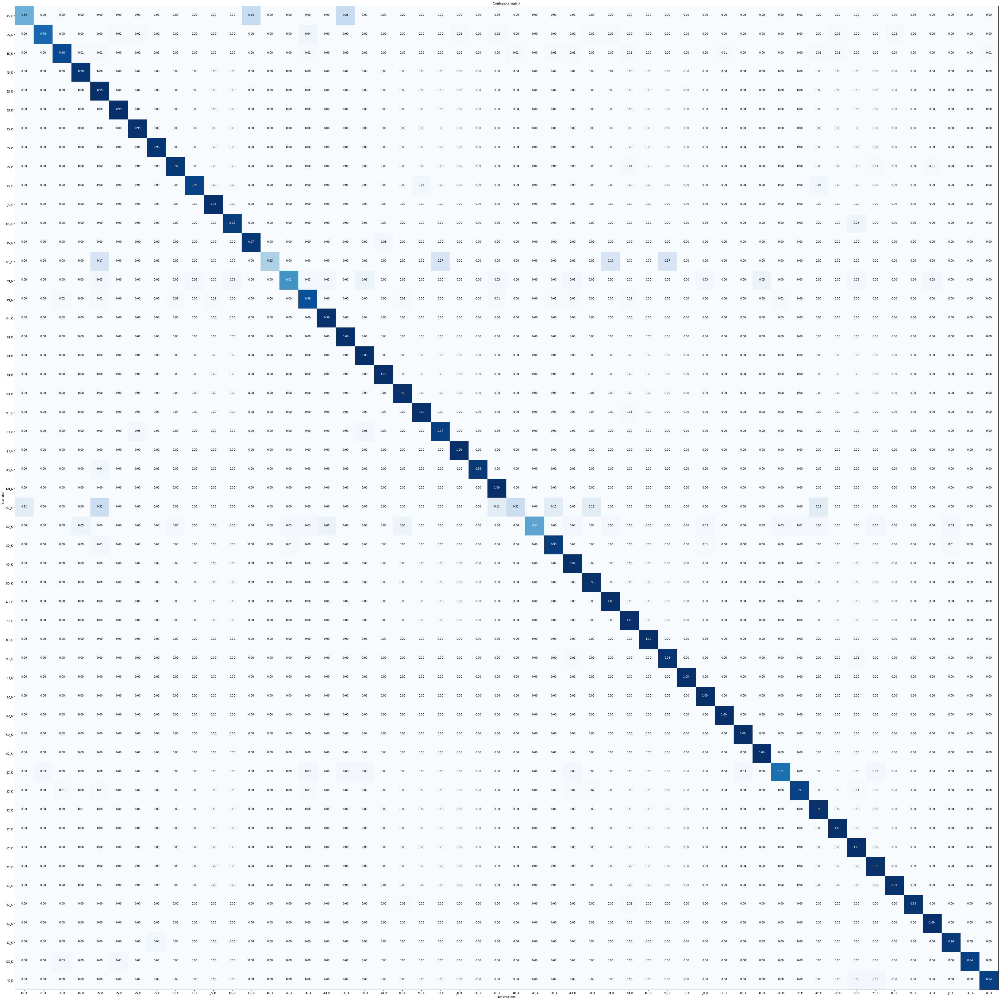

Confusion matrix, without normalization


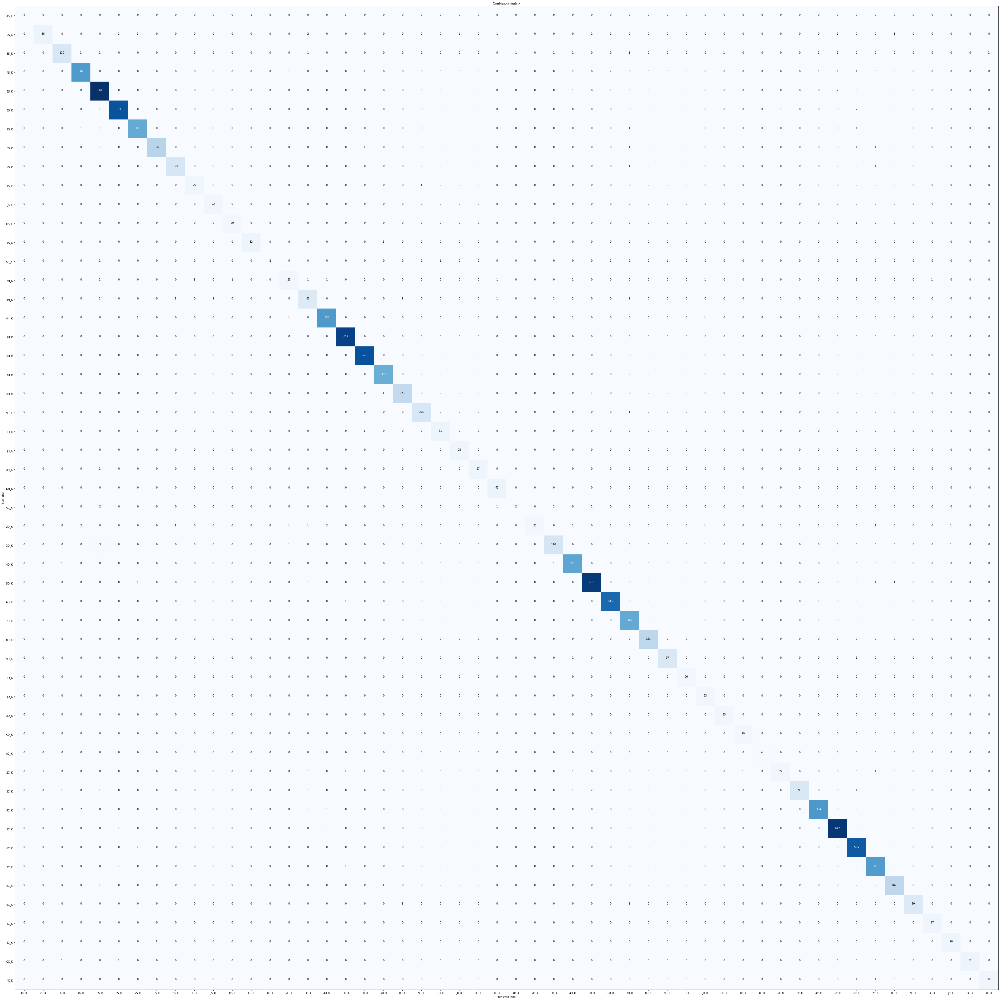

In [24]:
plot_cm(plot_pth, classes, model, test_loader_2k, device, numGames=currGames)

###### max validation accuracy

Accuracy: 98.24
Normalized confusion matrix


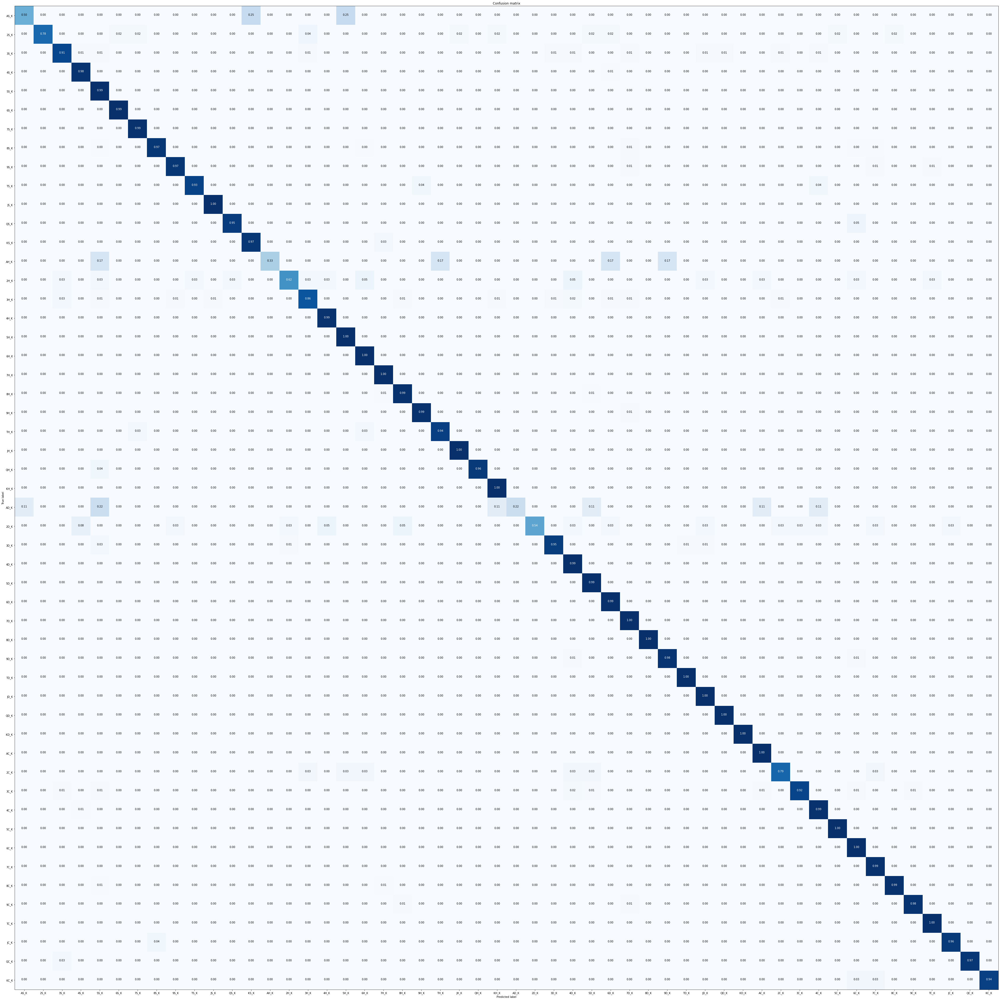

Confusion matrix, without normalization


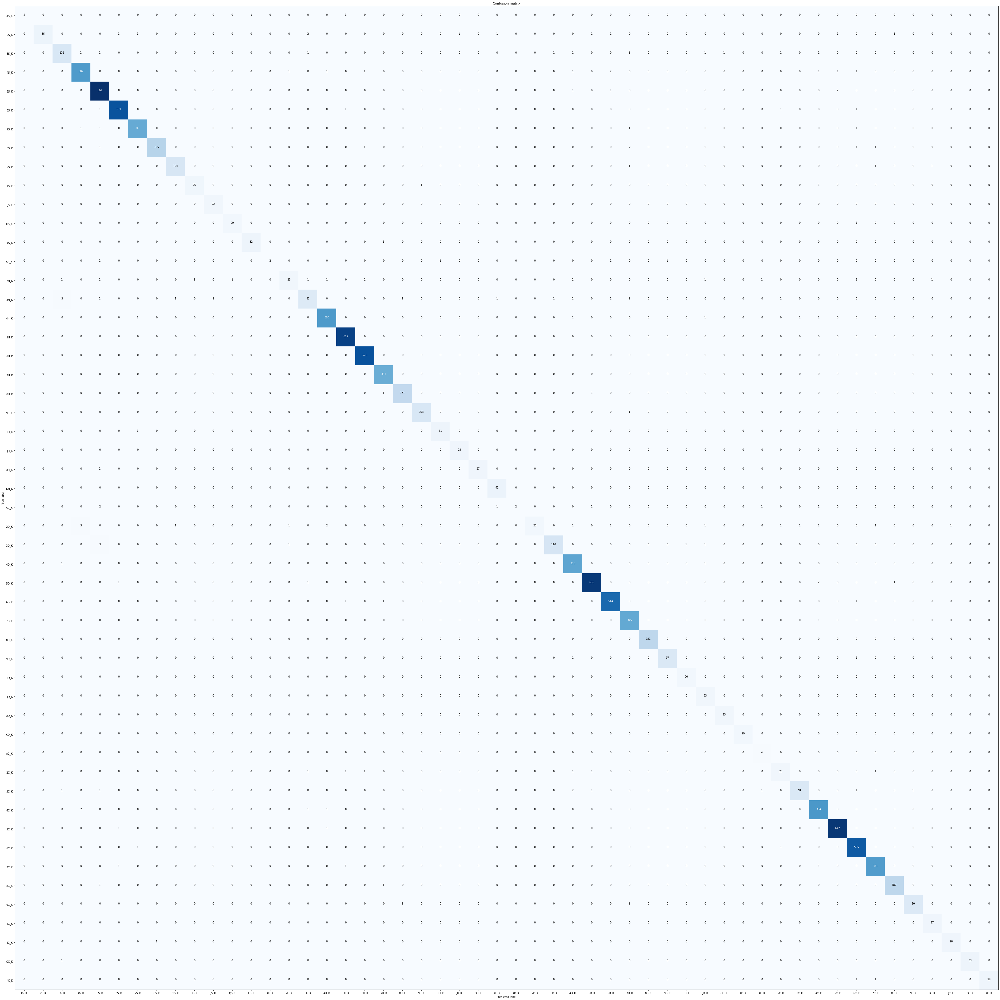

In [25]:
plot_cm(plot_pth, classes, model_acc, test_loader_2k, device, numGames=currGames, mode='acc')

###### min validation loss

Accuracy: 98.25
Normalized confusion matrix


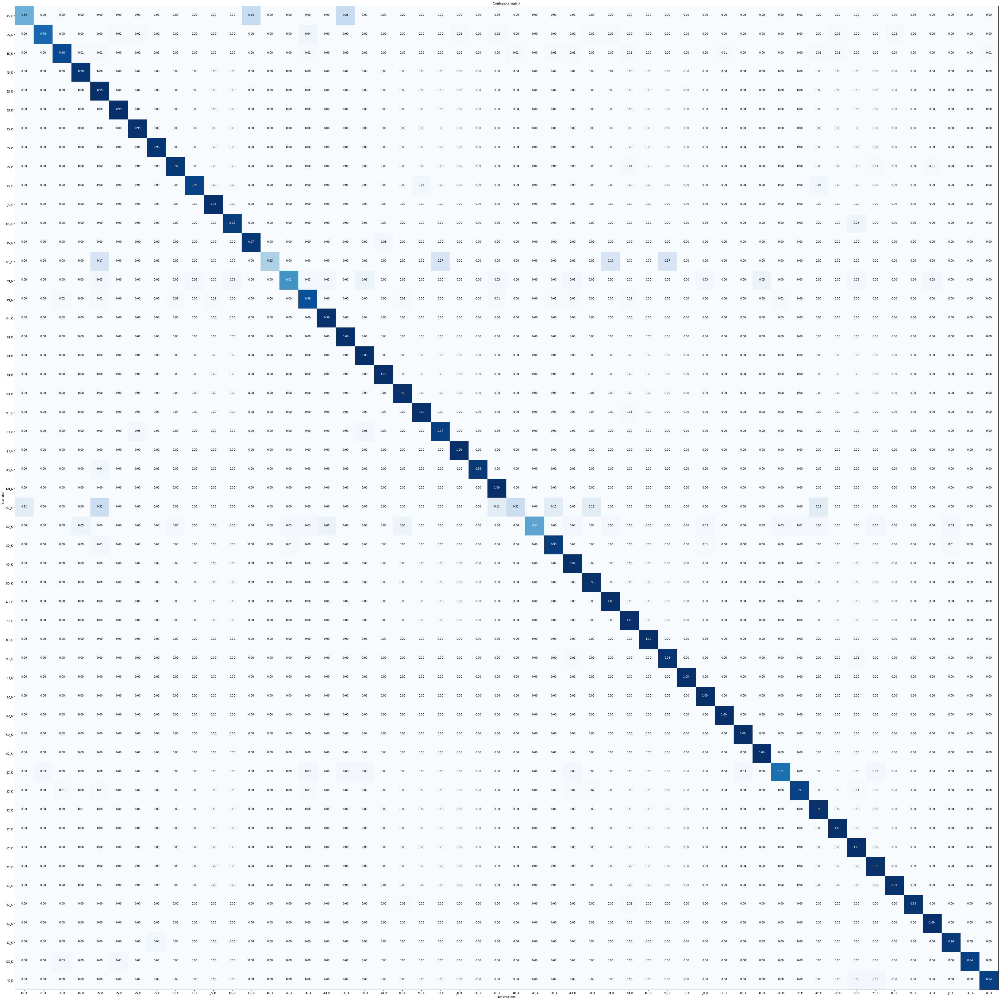

Confusion matrix, without normalization


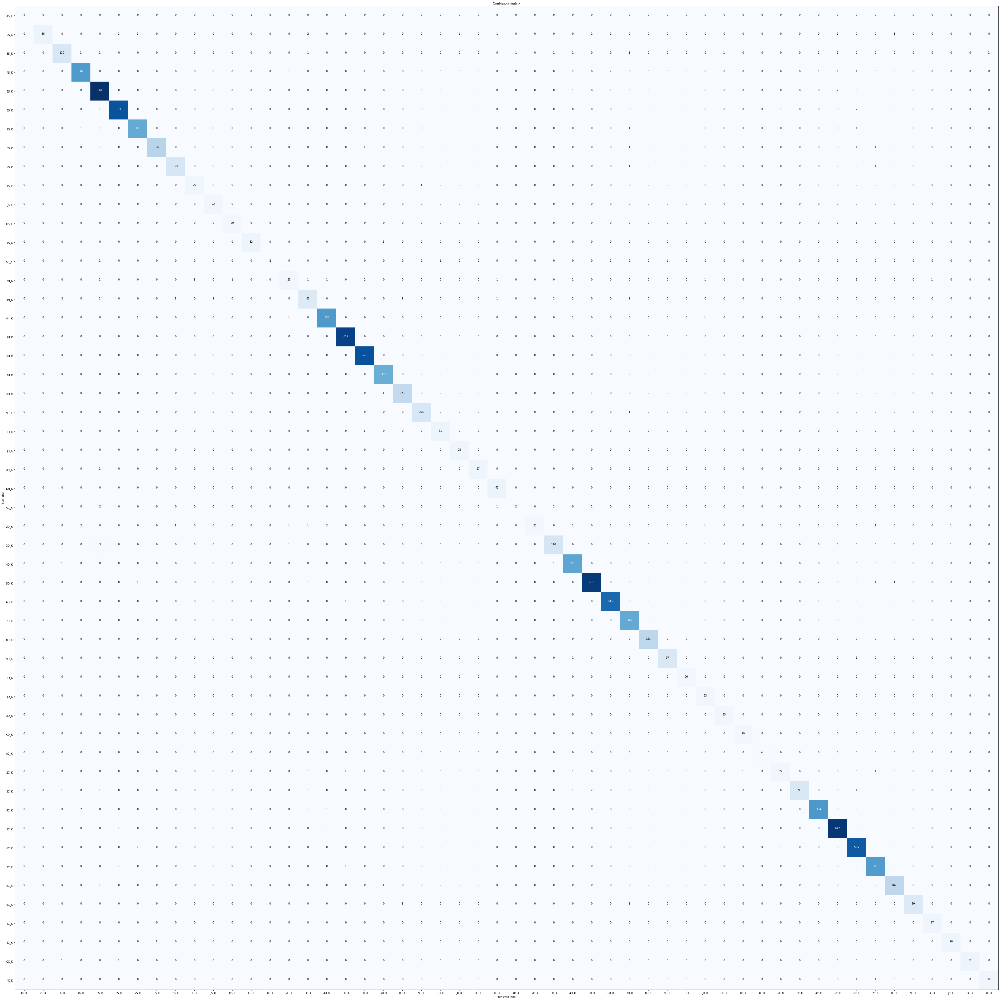

In [26]:
plot_cm(plot_pth, classes, model_loss, test_loader_2k, device, numGames=currGames, mode='loss')

## all_states_knock_only_PT

### Parameters

In [27]:
# state_action pair
state = 'apbd'
action = 'knock'

# model name
model_name = 'all_states_knock_only_PT'

# Number of Games
numGames = 8000

# prunable states
# {'currHand','topCard','deadCard','oppCard','unknownCard'} or blank if None
pruneStatesList = []

# choosable actions
# {'all','draw_pickup','discard','knock','knock_bin'}
actionChoice = 'knock'

# Balance classes
balance = False

# Training parameters
batch_size = 1000
lr = 0.001
epochs = 300

# Pretrain model
pre_train = True
model_PT = '/content/drive/MyDrive/Colab Notebooks/Thesis/models/apad/knock_bin/all_states_all_actions/model.pt'

# device for model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

### Create Directories

In [28]:
data_pth, model_pth, plot_pth = create_dir(pth, state, action, model_name)

### Load, Prune, and Split Training Data

loading 8000 games dataset from /content/drive/MyDrive/Colab Notebooks/Thesis/data/apbd/knock


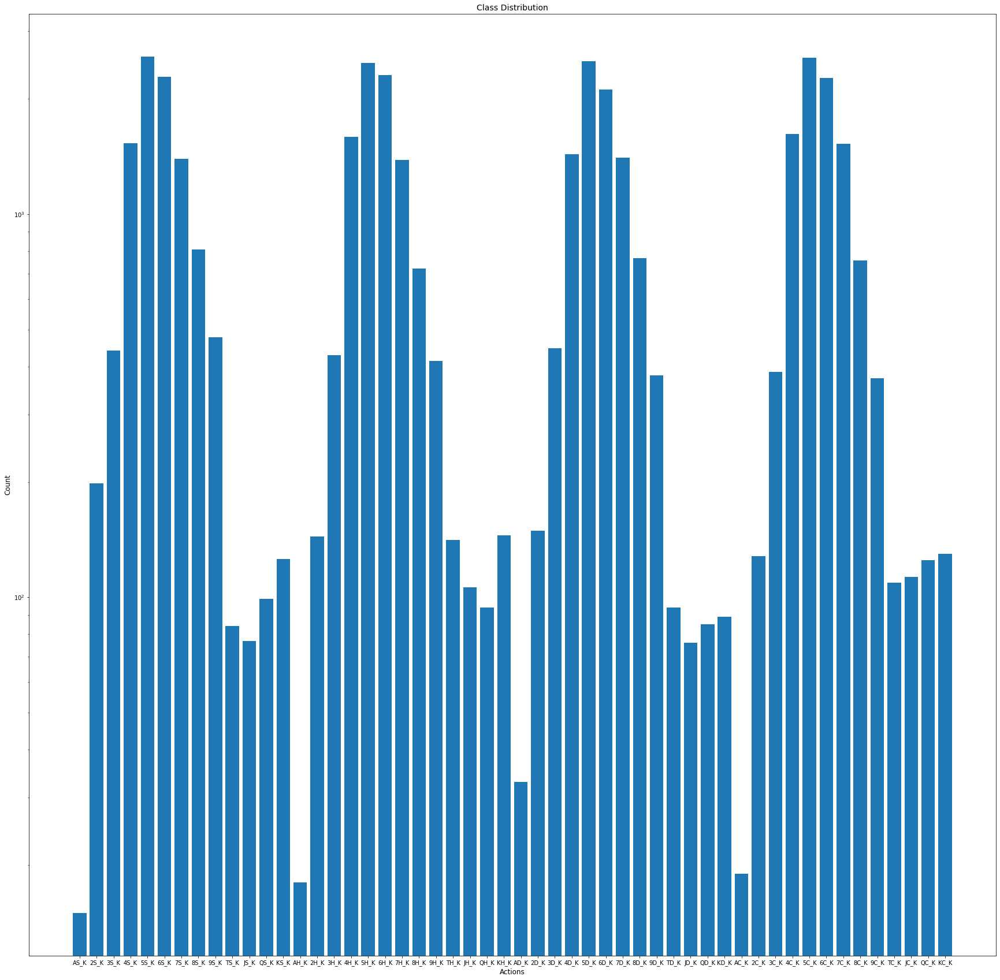

In [29]:
train_loader, val_loader, classes = load_train_data(data_pth, plot_pth,
                                                    numGames, batch_size, 
                                                    state, action, 
                                                    pruneStatesList, actionChoice, 
                                                    balance, visualize=True)

### Train Model

Epoch: 1 | Train Loss: 0.08115052 | Train acc: 0.023054
              Val Loss: 0.02023701 |   Val acc: 0.041977
Epoch: 2 | Train Loss: 0.01907964 | Train acc: 0.071352
              Val Loss: 0.01873758 |   Val acc: 0.104147
Epoch: 3 | Train Loss: 0.01866409 | Train acc: 0.118931
              Val Loss: 0.01857728 |   Val acc: 0.141768
Epoch: 4 | Train Loss: 0.01848837 | Train acc: 0.163279
              Val Loss: 0.01837451 |   Val acc: 0.189359
Epoch: 5 | Train Loss: 0.01826191 | Train acc: 0.212044
              Val Loss: 0.01812071 |   Val acc: 0.241726
Epoch: 6 | Train Loss: 0.01797216 | Train acc: 0.267955
              Val Loss: 0.01778778 |   Val acc: 0.300712
Epoch: 7 | Train Loss: 0.01758056 | Train acc: 0.323793
              Val Loss: 0.01733075 |   Val acc: 0.345203
Epoch: 8 | Train Loss: 0.01705942 | Train acc: 0.360600
              Val Loss: 0.01676266 |   Val acc: 0.378048
Epoch: 9 | Train Loss: 0.01644499 | Train acc: 0.388789
              Val Loss: 0.01611125 |   V

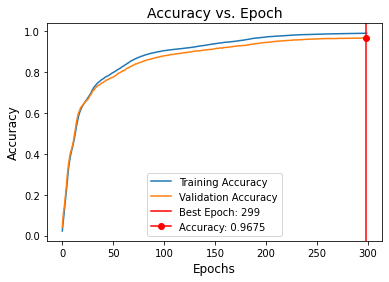

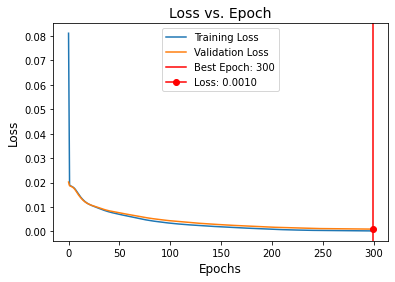

In [30]:
model, model_acc, model_loss = train(train_loader, val_loader, plot_pth, batch_size, lr, epochs, verbose=True, pre_train=pre_train, model_PT=model_PT, device=device)
torch.save(model, '{}/model.pt'.format(model_pth))
torch.save(model_acc, '{}/model_acc.pt'.format(model_pth))
torch.save(model_loss, '{}/model_loss.pt'.format(model_pth))

#### Confusion Matrix

##### Load Models

In [31]:
model = torch.load('{}/model.pt'.format(model_pth), map_location=device)
model_acc = torch.load('{}/model_acc.pt'.format(model_pth), map_location=device)
model_loss = torch.load('{}/model_loss.pt'.format(model_pth), map_location=device)

##### Train Set

Accuracy: 99.02
Normalized confusion matrix


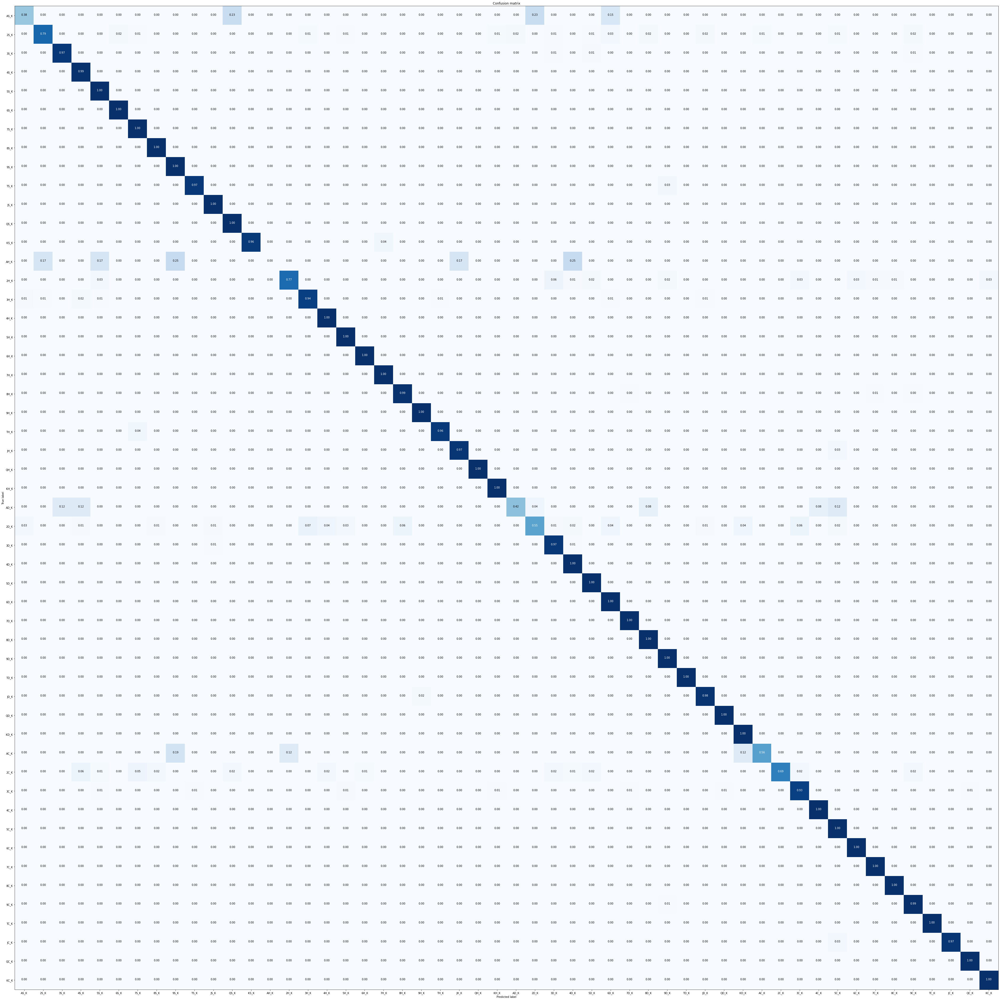

Confusion matrix, without normalization


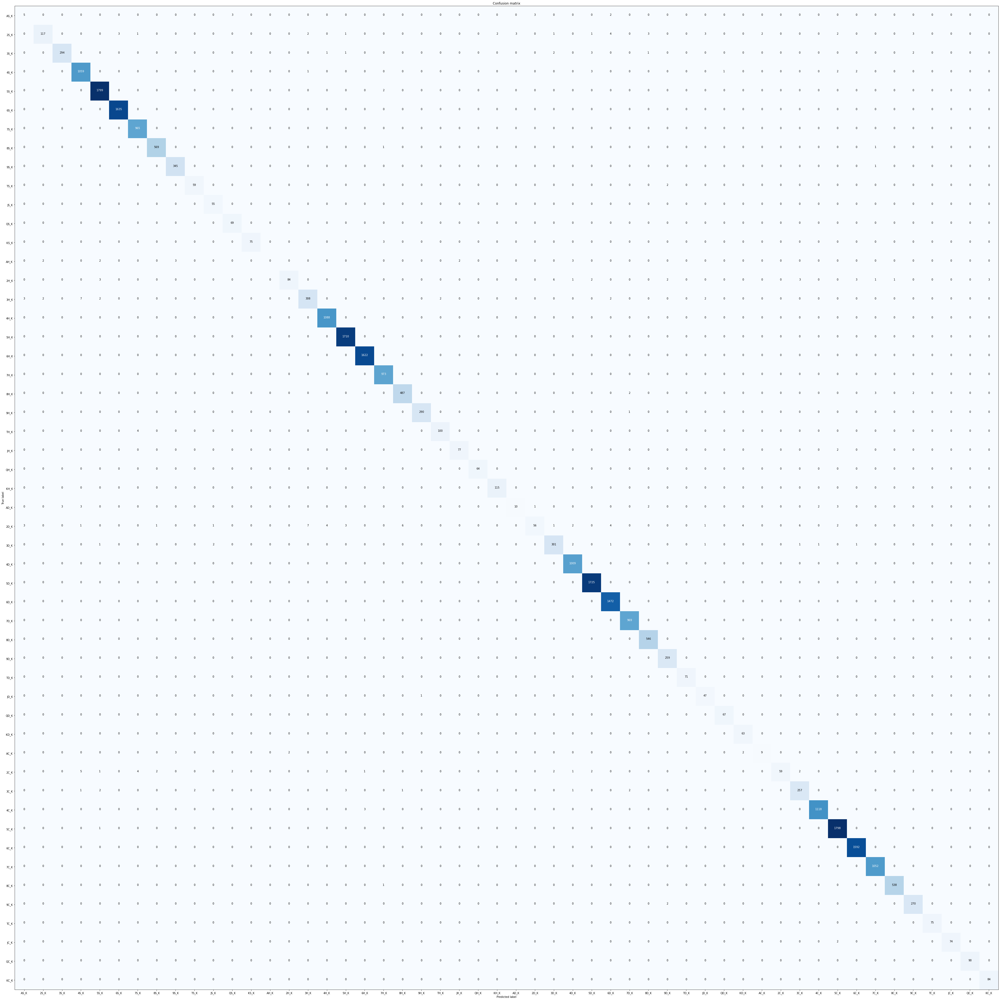

In [32]:
currGames = 8000
plot_cm(plot_pth, classes, model, train_loader, device, numGames=currGames)

##### Validation Set

Accuracy: 96.71
Normalized confusion matrix


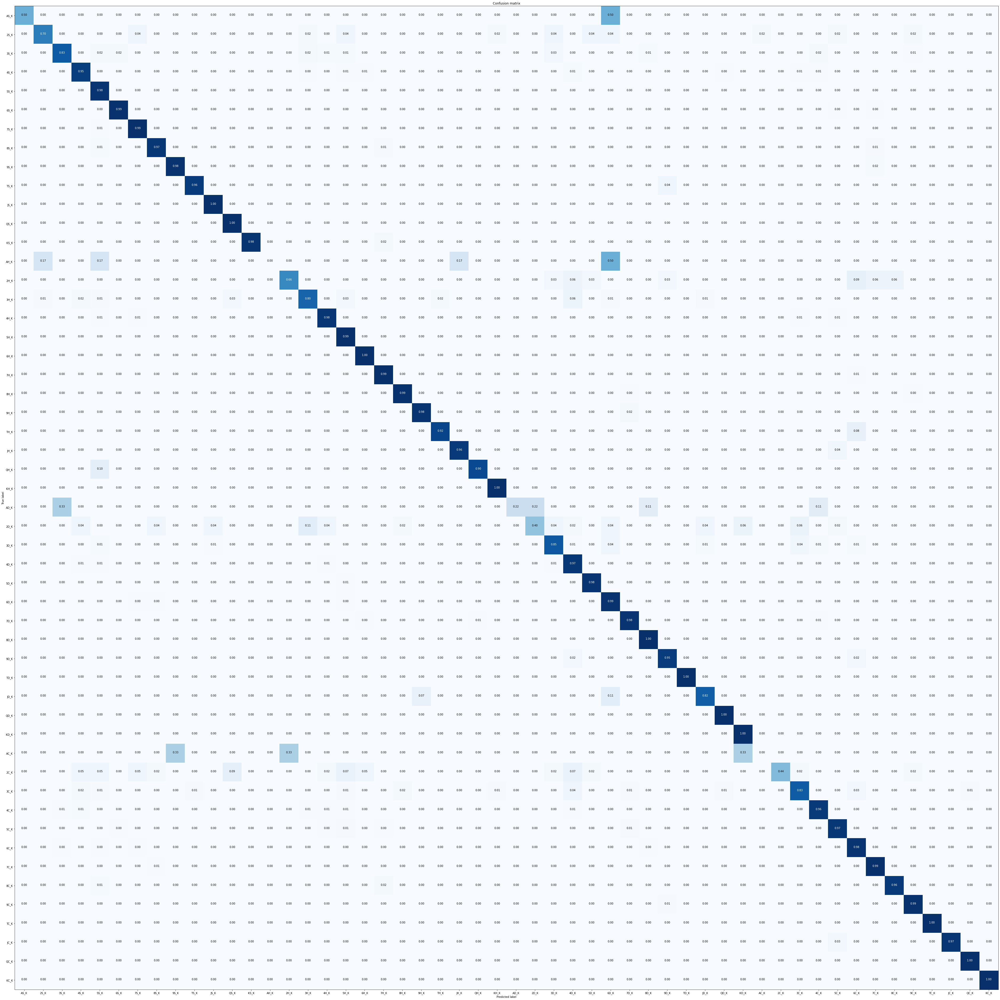

Confusion matrix, without normalization


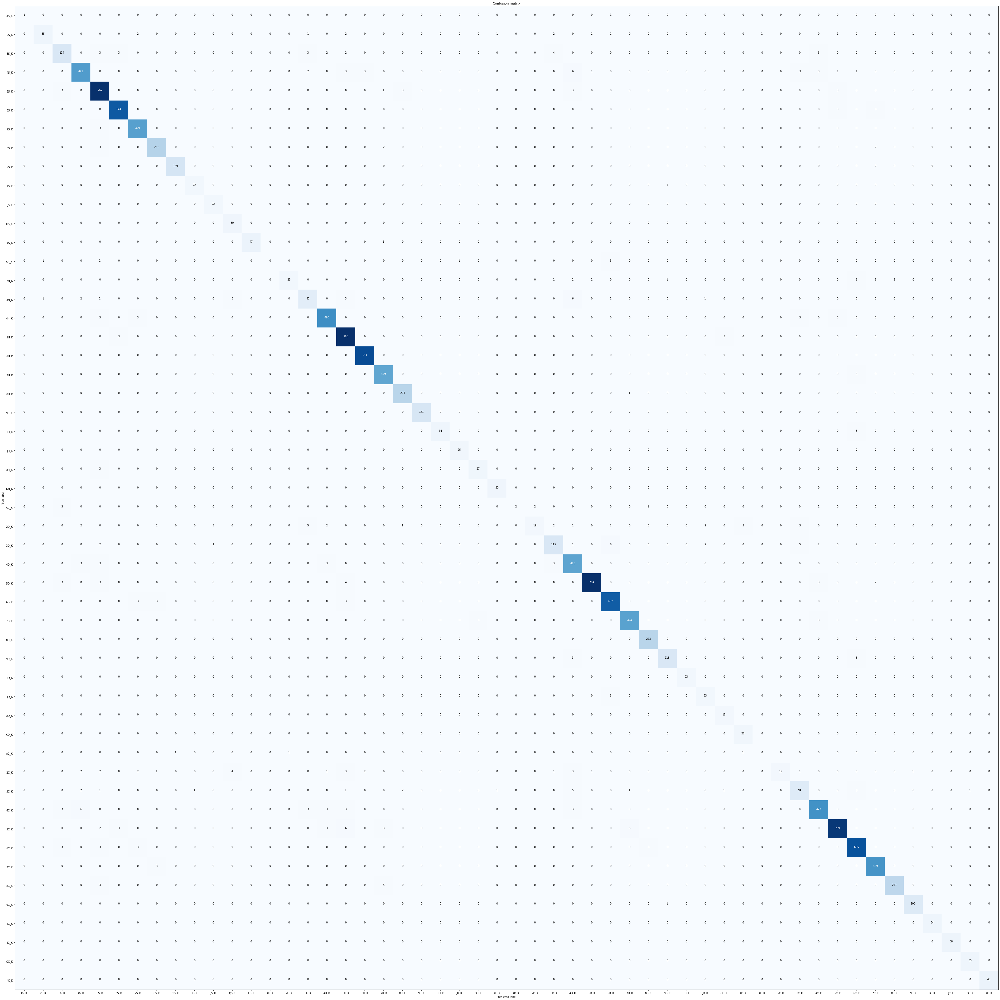

In [33]:
currGames = 8000
plot_cm(plot_pth, classes, model, val_loader, device, numGames=currGames, mode='val')

##### Test Set (6k)

loading 6000 games dataset from /content/drive/MyDrive/Colab Notebooks/Thesis/data/apbd/knock
Accuracy: 98.30
Normalized confusion matrix


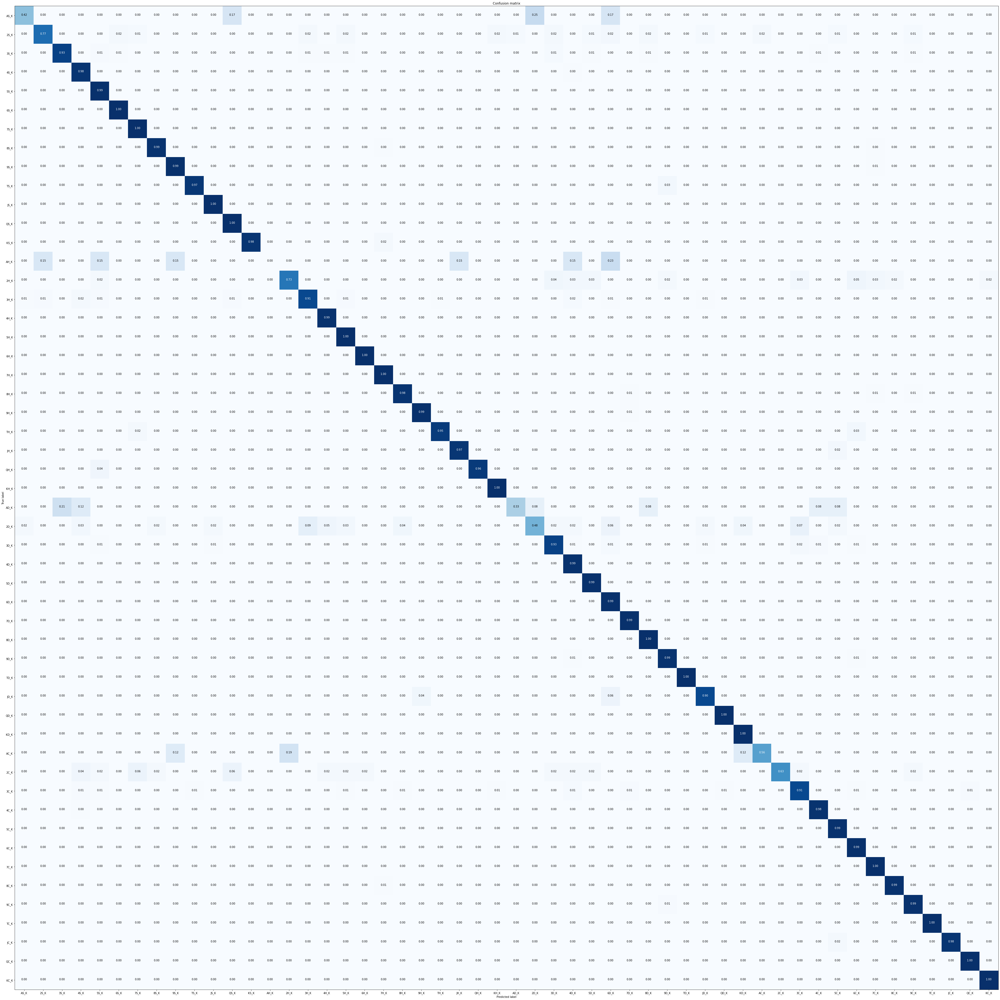

Confusion matrix, without normalization


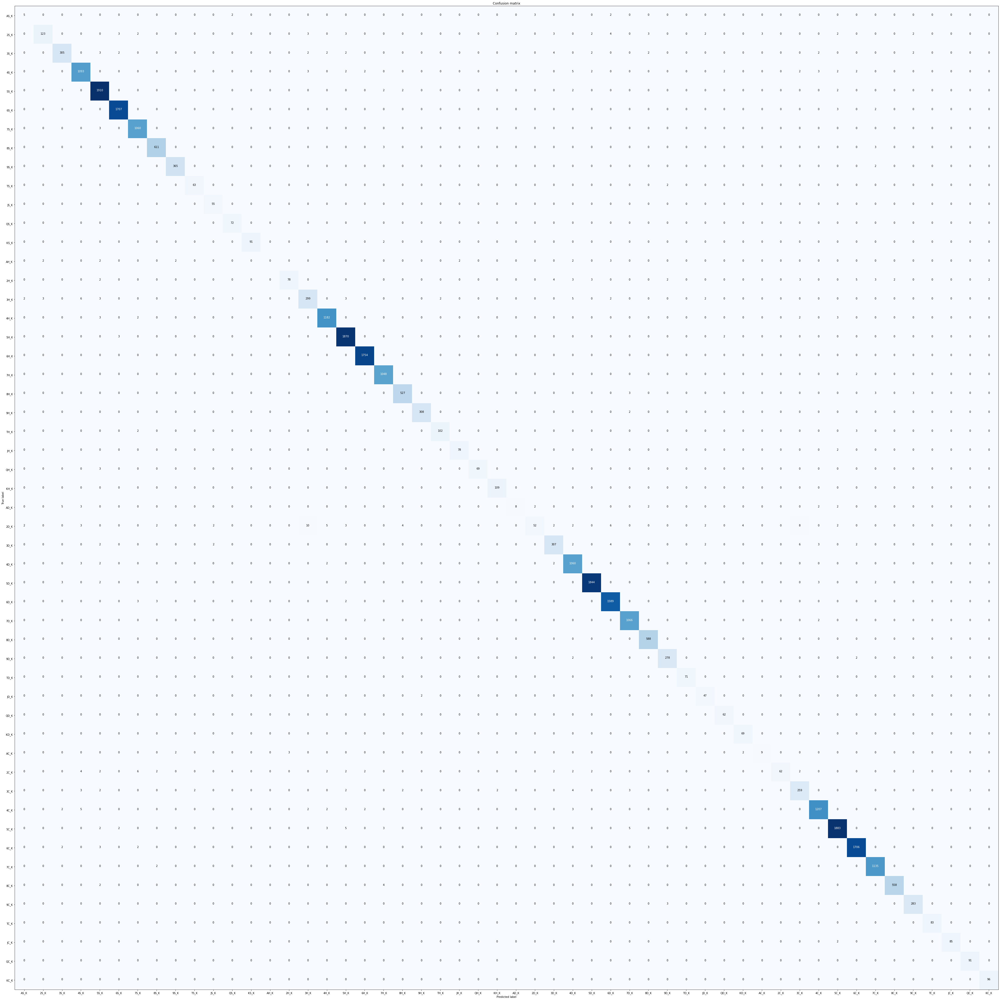

In [34]:
currGames = 6000
test_loader_6k, classes = load_test_data(data_pth, currGames, state, action,
                                         pruneStatesList, actionChoice)
plot_cm(plot_pth, classes, model, test_loader_6k, device, numGames=currGames)

##### Test Set (2k)

Test on all three models generated:

In [35]:
currGames = 2000
test_loader_2k, classes = load_test_data(data_pth, currGames, state, action,
                                         pruneStatesList, actionChoice)

loading 2000 games dataset from /content/drive/MyDrive/Colab Notebooks/Thesis/data/apbd/knock


###### all epoch

Accuracy: 98.26
Normalized confusion matrix


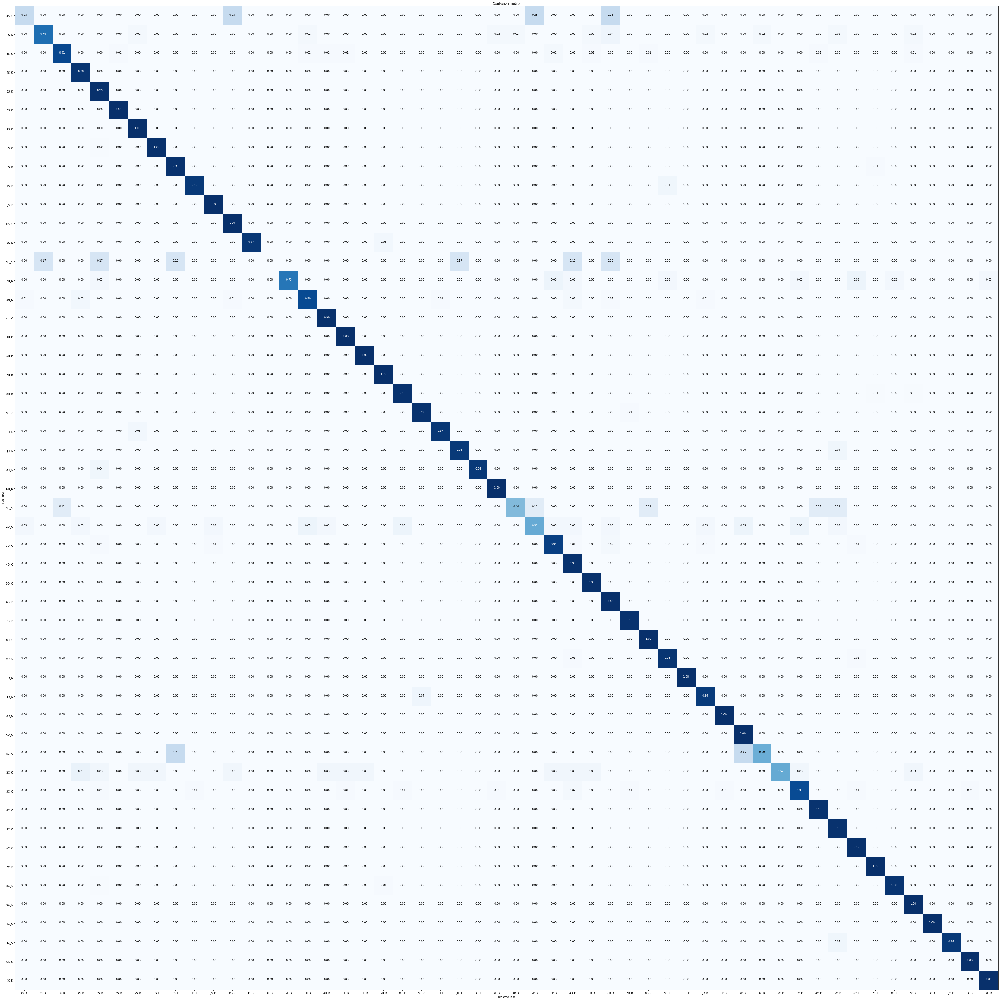

Confusion matrix, without normalization


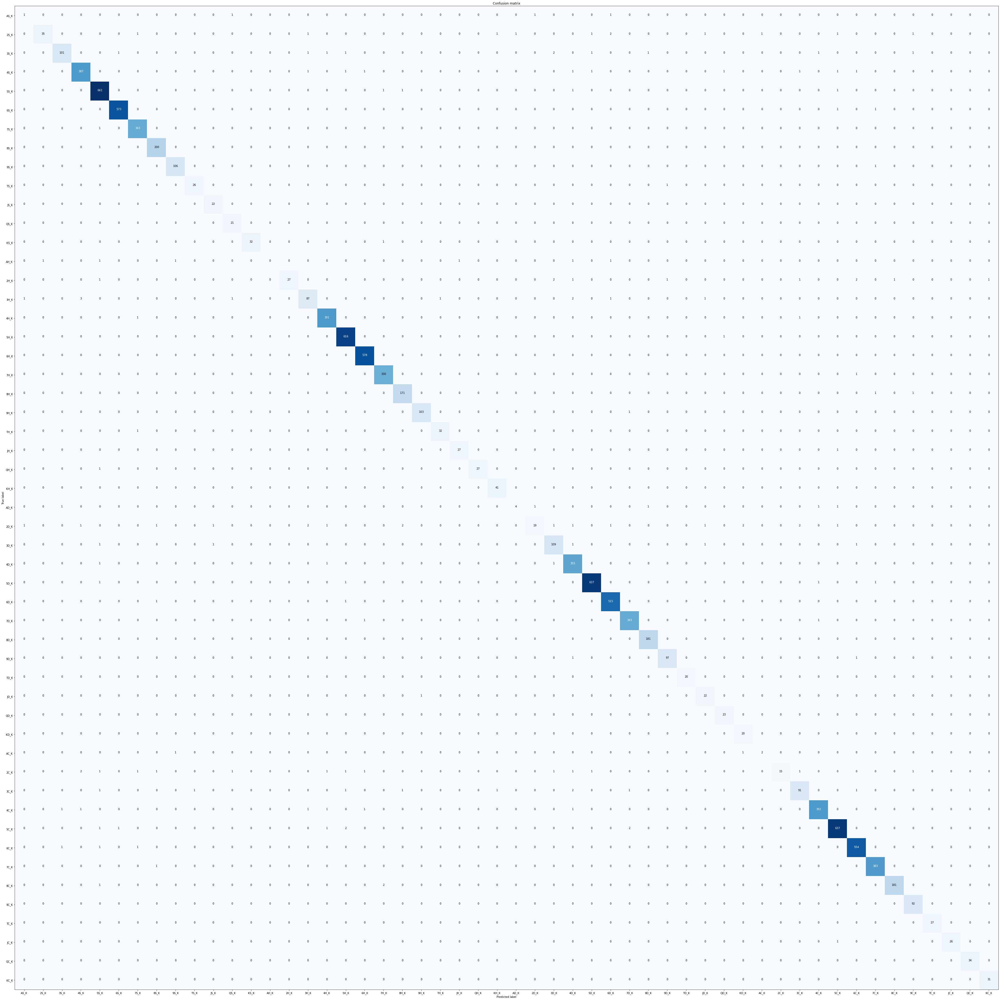

In [36]:
plot_cm(plot_pth, classes, model, test_loader_2k, device, numGames=currGames)

###### max validation accuracy

Accuracy: 98.26
Normalized confusion matrix


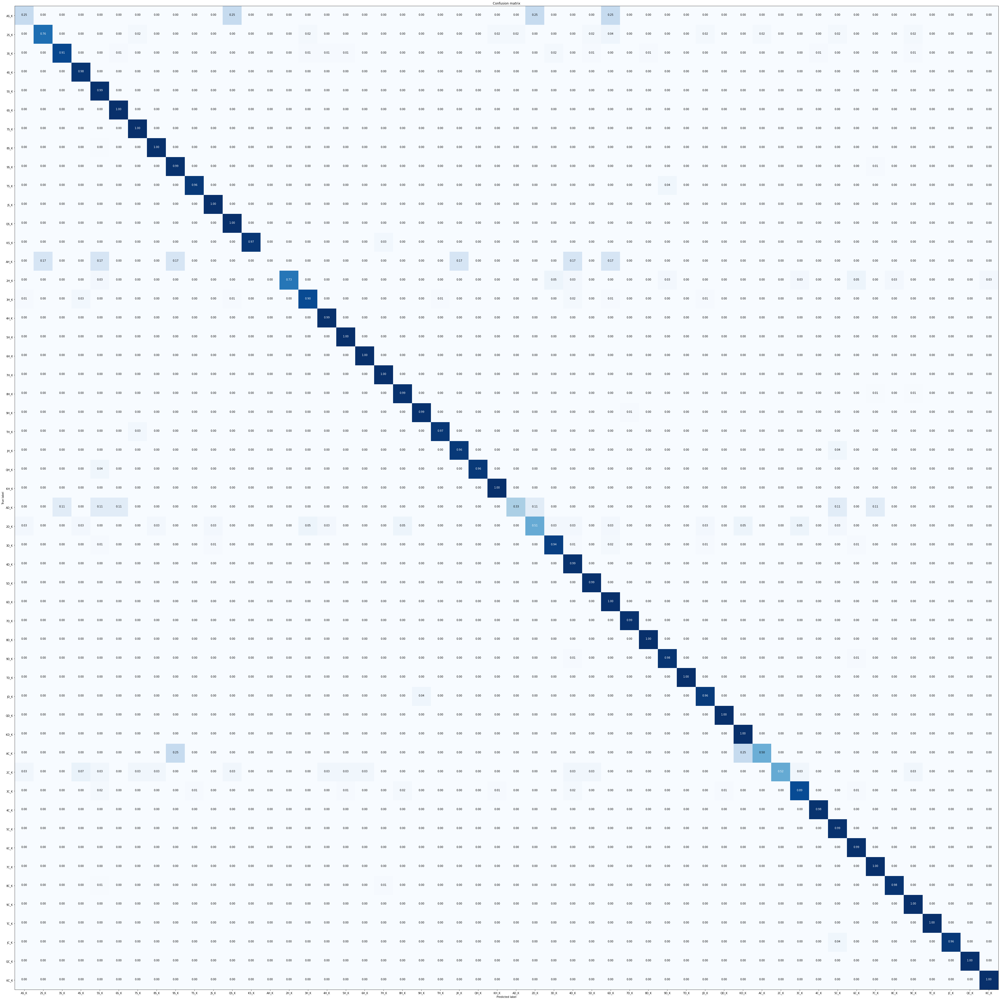

Confusion matrix, without normalization


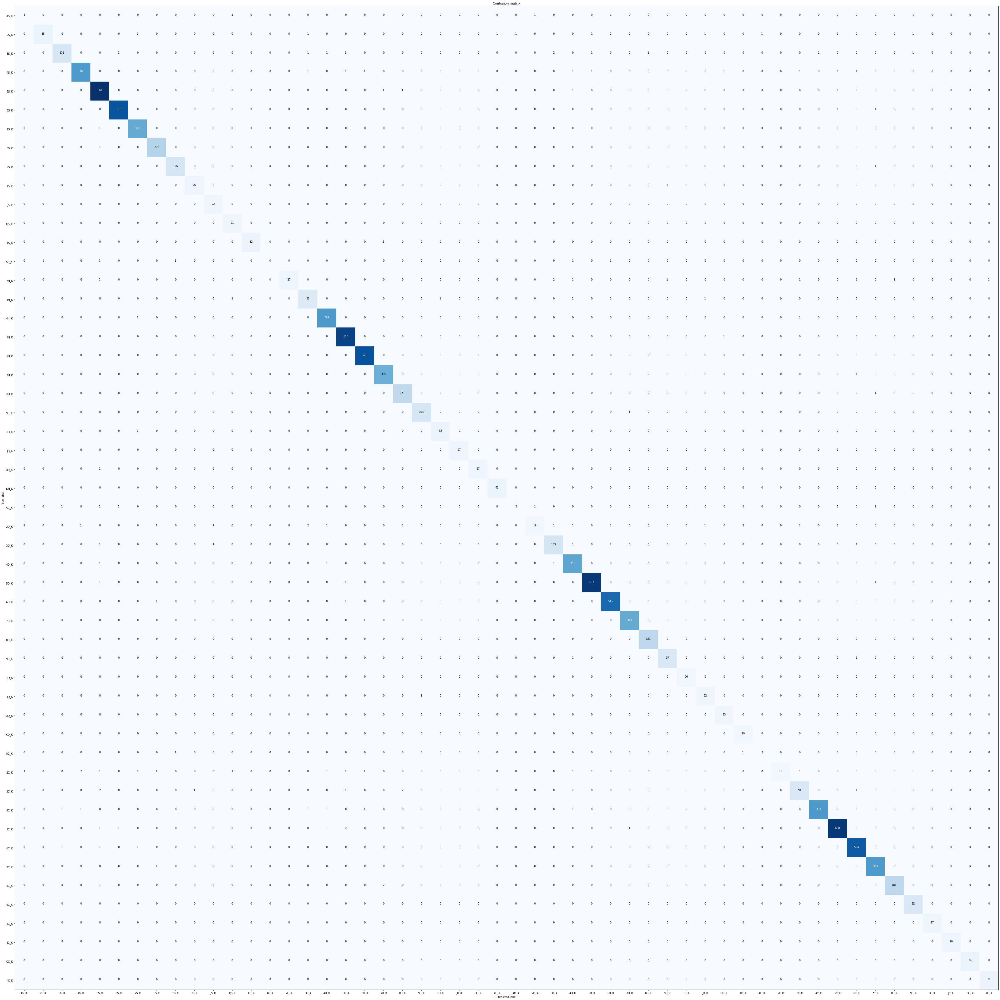

In [37]:
plot_cm(plot_pth, classes, model_acc, test_loader_2k, device, numGames=currGames, mode='acc')

###### min validation loss

Accuracy: 98.26
Normalized confusion matrix


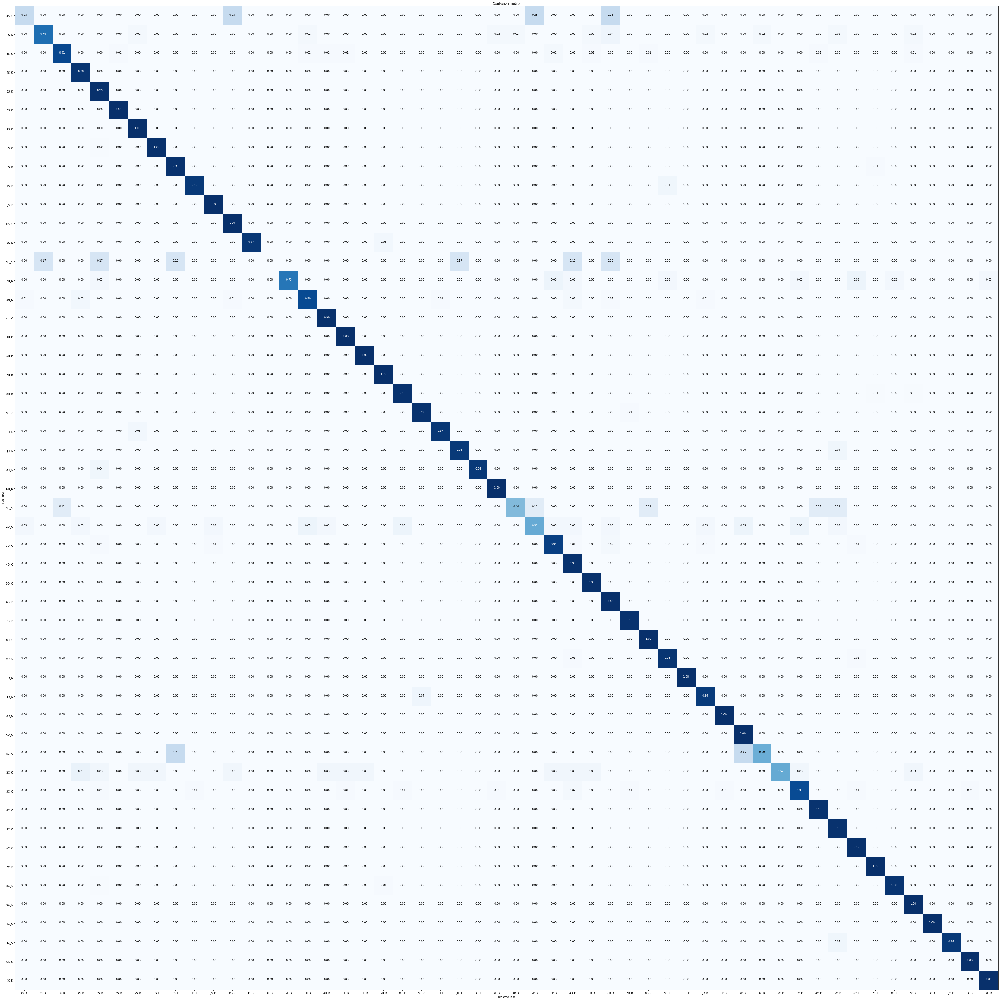

Confusion matrix, without normalization


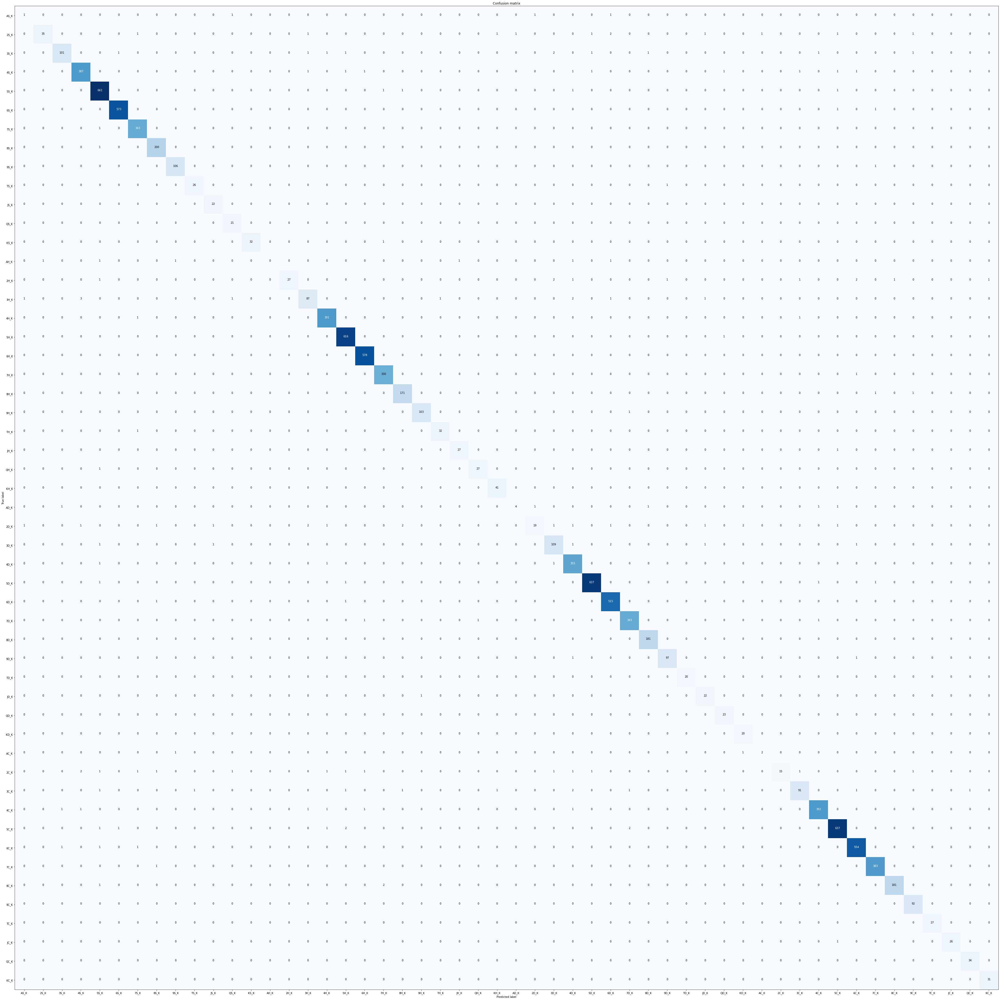

In [38]:
plot_cm(plot_pth, classes, model_loss, test_loader_2k, device, numGames=currGames, mode='loss')

## all_states_all_actions

### Parameters

In [39]:
# state_action pair
state = 'apbd'
action = 'knock'

# model name
model_name = 'all_states_all_actions'

# Number of Games
numGames = 8000

# prunable states
# {'currHand','topCard','deadCard','oppCard','unknownCard'} or blank if None
pruneStatesList = []

# choosable actions
# {'all','draw_pickup','discard','knock','knock_bin'}
actionChoice = 'knock'

# Balance classes
balance = False

# Training parameters
batch_size = 1000
lr = 0.001
epochs = 300

# Pretrain model
pre_train = True
model_PT = '/content/drive/MyDrive/Colab Notebooks/Thesis/models/apad/knock_bin/all_states_all_actions/model.pt'

# device for model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

### Create Directories

In [40]:
data_pth, model_pth, plot_pth = create_dir(pth, state, action, model_name)

### Load, Prune, and Split Training Data

loading 8000 games dataset from /content/drive/MyDrive/Colab Notebooks/Thesis/data/apbd/knock


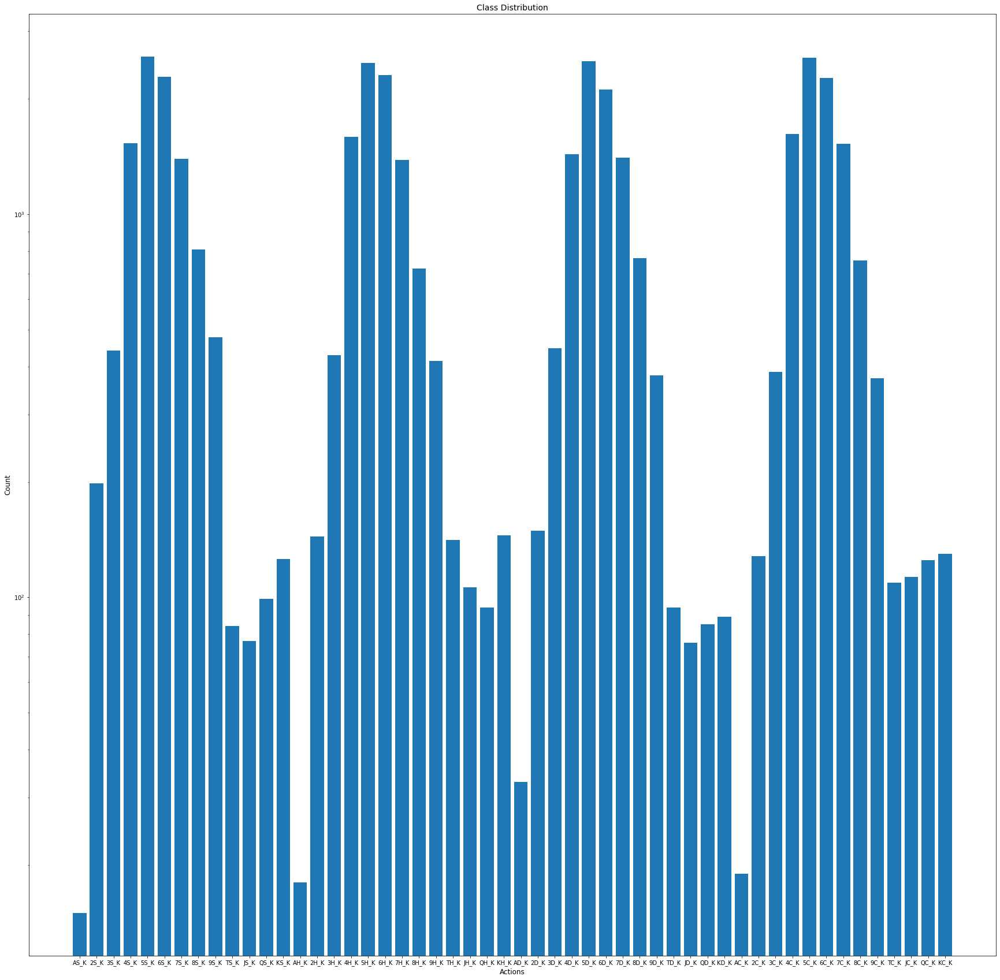

In [41]:
train_loader, val_loader, classes = load_train_data(data_pth, plot_pth,
                                                    numGames, batch_size, 
                                                    state, action, 
                                                    pruneStatesList, actionChoice, 
                                                    balance, visualize=True)

### Train Model

Epoch: 1 | Train Loss: 0.08009372 | Train acc: 0.039859
              Val Loss: 0.02006520 |   Val acc: 0.059908
Epoch: 2 | Train Loss: 0.01900634 | Train acc: 0.095842
              Val Loss: 0.01870271 |   Val acc: 0.126183
Epoch: 3 | Train Loss: 0.01862848 | Train acc: 0.138107
              Val Loss: 0.01854838 |   Val acc: 0.156431
Epoch: 4 | Train Loss: 0.01845935 | Train acc: 0.166834
              Val Loss: 0.01835535 |   Val acc: 0.183326
Epoch: 5 | Train Loss: 0.01824728 | Train acc: 0.202743
              Val Loss: 0.01811846 |   Val acc: 0.223879
Epoch: 6 | Train Loss: 0.01798603 | Train acc: 0.254201
              Val Loss: 0.01782320 |   Val acc: 0.286887
Epoch: 7 | Train Loss: 0.01764456 | Train acc: 0.306665
              Val Loss: 0.01742597 |   Val acc: 0.333054
Epoch: 8 | Train Loss: 0.01718951 | Train acc: 0.344369
              Val Loss: 0.01691969 |   Val acc: 0.359782
Epoch: 9 | Train Loss: 0.01663607 | Train acc: 0.369147
              Val Loss: 0.01632152 |   V

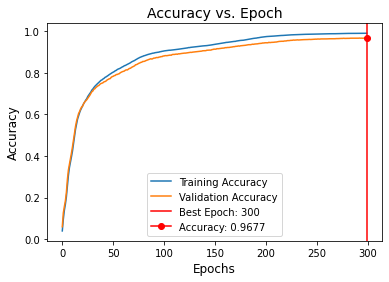

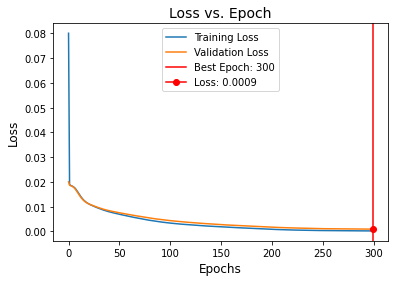

In [42]:
model, model_acc, model_loss = train(train_loader, val_loader, plot_pth, batch_size, lr, epochs, verbose=True, pre_train=pre_train, model_PT=model_PT, device=device)
torch.save(model, '{}/model.pt'.format(model_pth))
torch.save(model_acc, '{}/model_acc.pt'.format(model_pth))
torch.save(model_loss, '{}/model_loss.pt'.format(model_pth))

#### Confusion Matrix

##### Load Models

In [43]:
model = torch.load('{}/model.pt'.format(model_pth), map_location=device)
model_acc = torch.load('{}/model_acc.pt'.format(model_pth), map_location=device)
model_loss = torch.load('{}/model_loss.pt'.format(model_pth), map_location=device)

##### Train Set

Accuracy: 99.10
Normalized confusion matrix


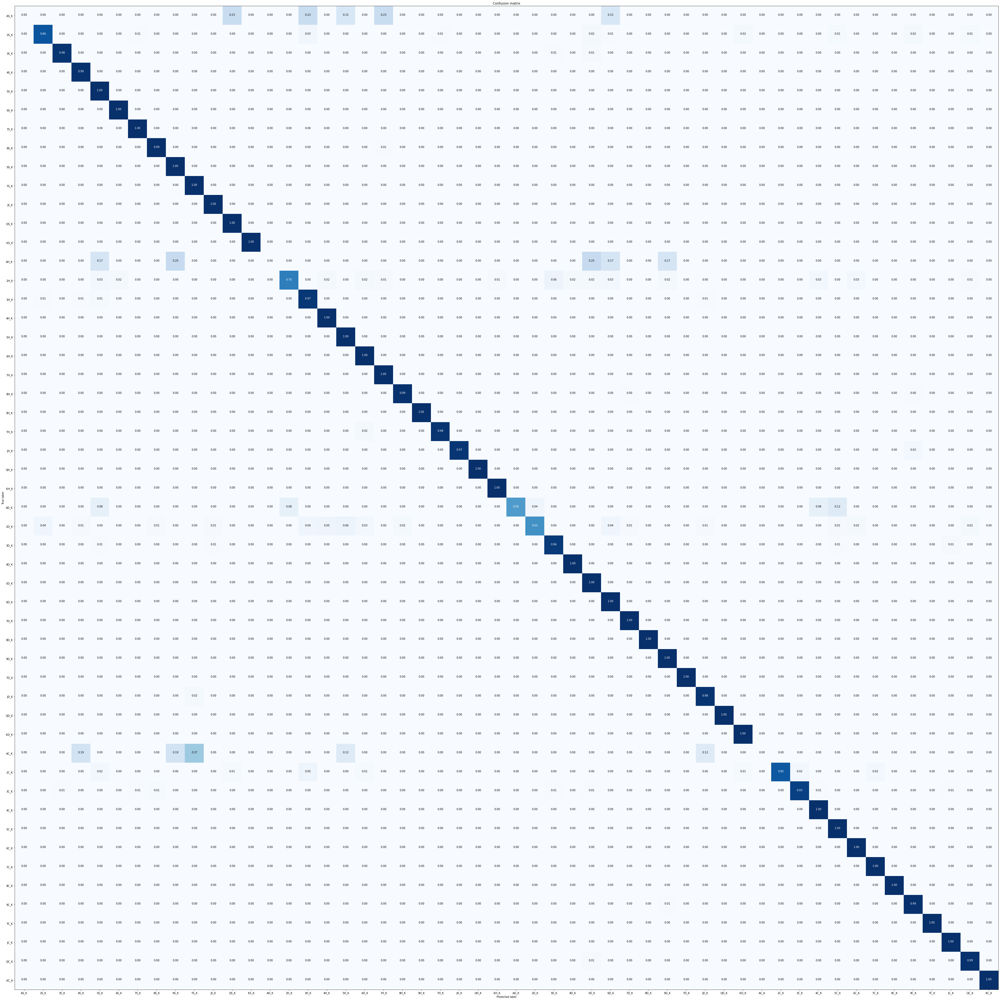

Confusion matrix, without normalization


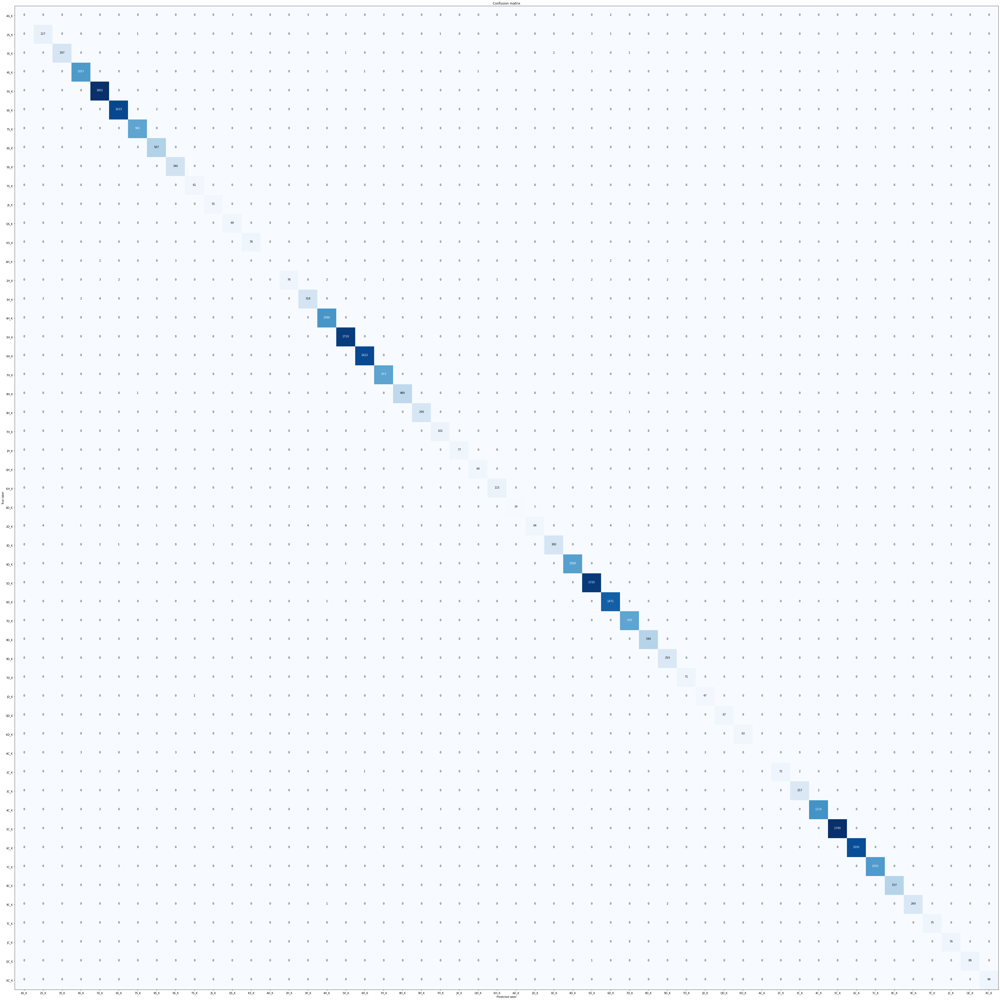

In [44]:
currGames = 8000
plot_cm(plot_pth, classes, model, train_loader, device, numGames=currGames)

##### Validation Set

Accuracy: 96.77
Normalized confusion matrix


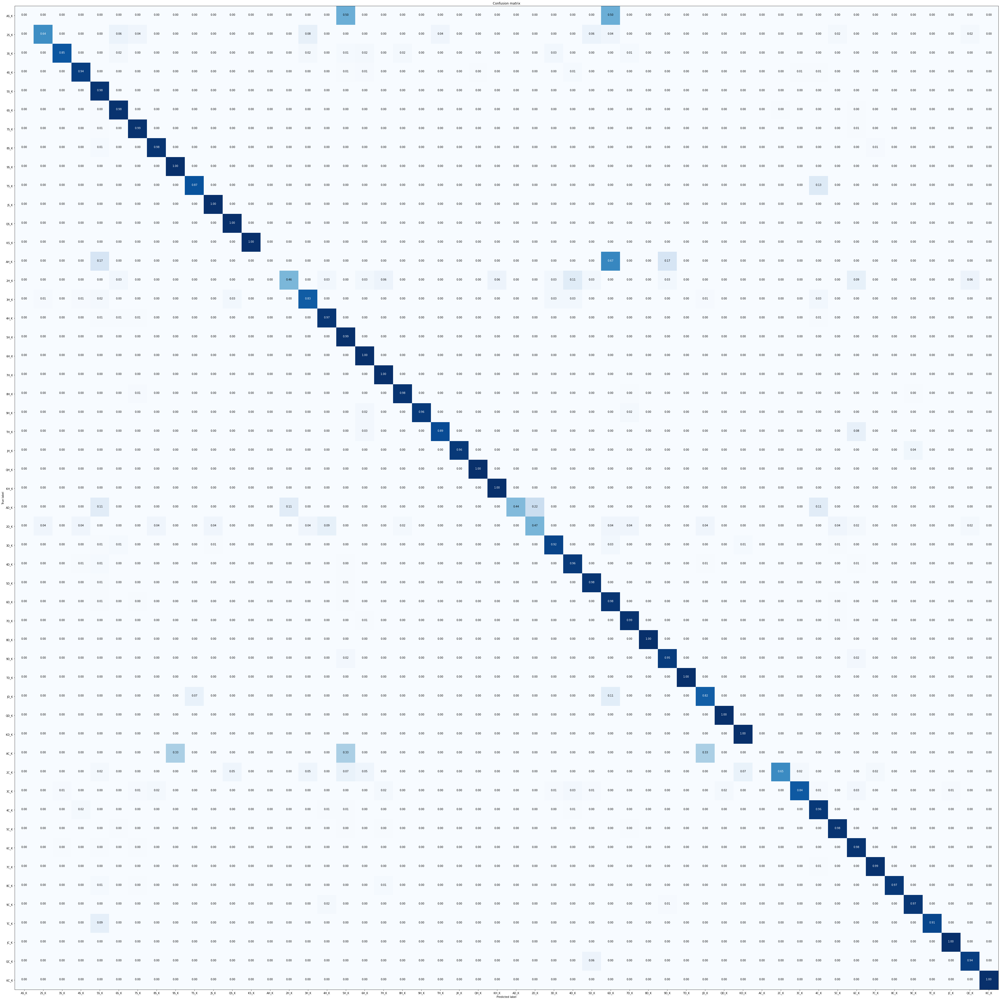

Confusion matrix, without normalization


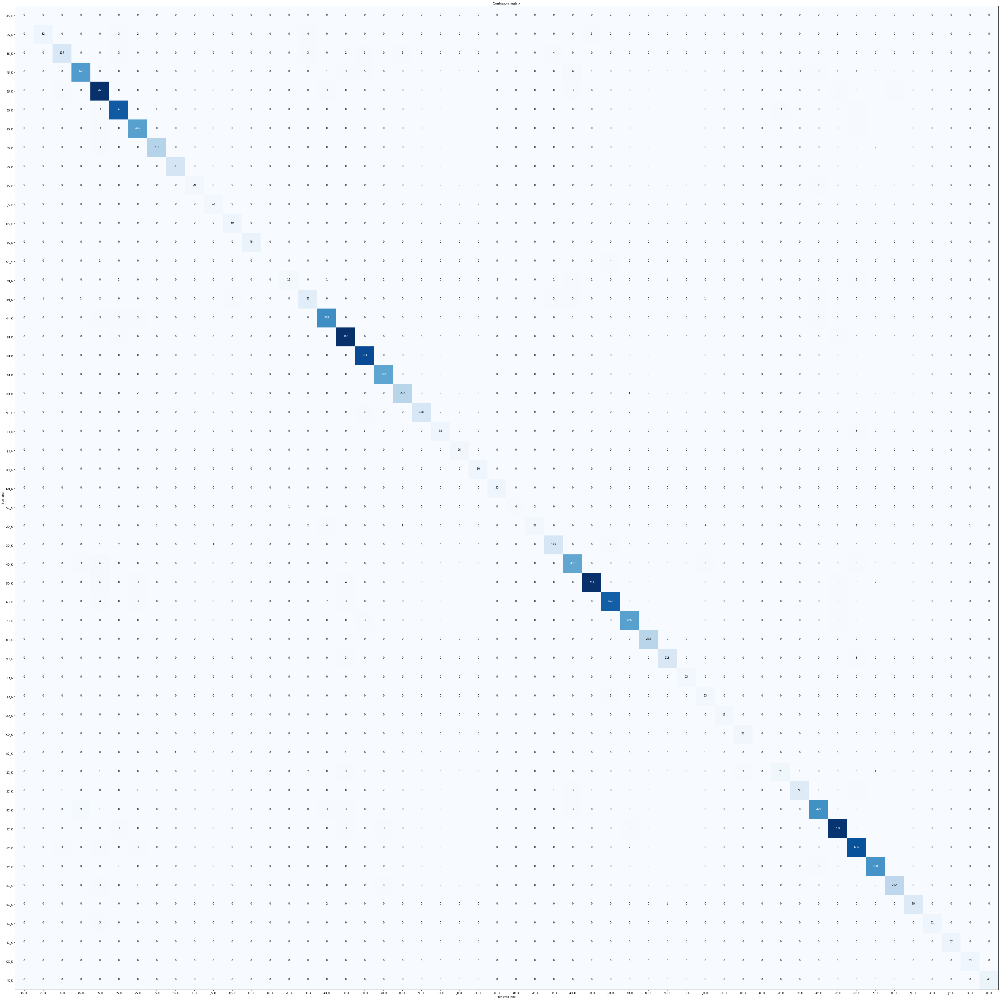

In [45]:
currGames = 8000
plot_cm(plot_pth, classes, model, val_loader, device, numGames=currGames, mode='val')

##### Test Set (6k)

loading 6000 games dataset from /content/drive/MyDrive/Colab Notebooks/Thesis/data/apbd/knock
Accuracy: 98.34
Normalized confusion matrix


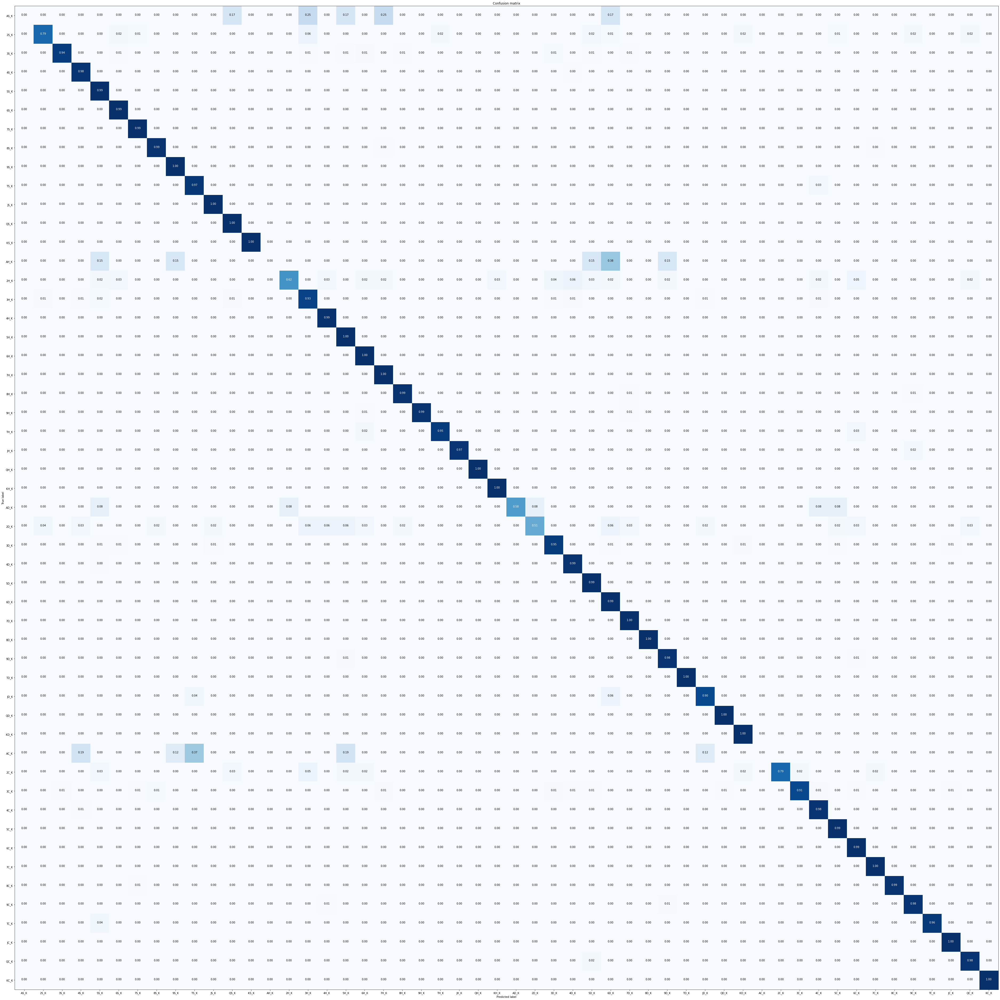

Confusion matrix, without normalization


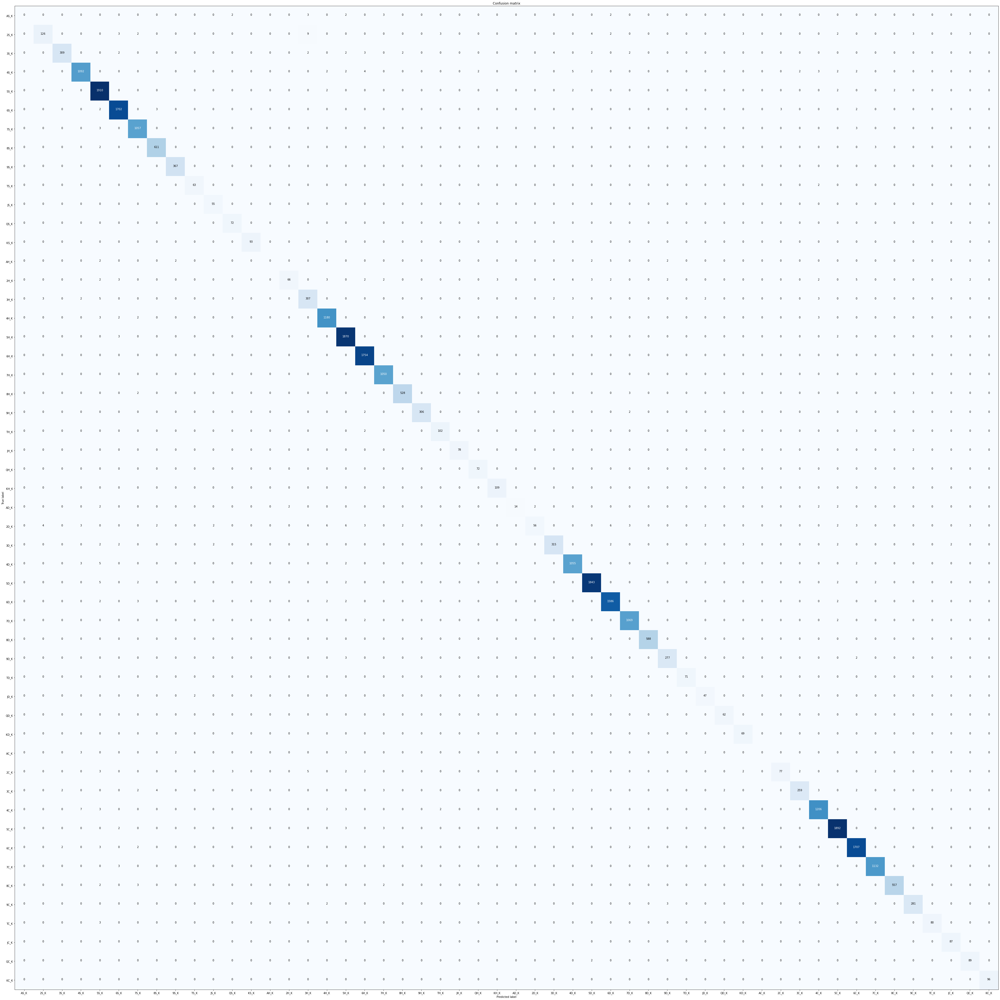

In [46]:
currGames = 6000
test_loader_6k, classes = load_test_data(data_pth, currGames, state, action,
                                         pruneStatesList, actionChoice)
plot_cm(plot_pth, classes, model, test_loader_6k, device, numGames=currGames)

##### Test Set (2k)

Test on all three models generated:

In [47]:
currGames = 2000
test_loader_2k, classes = load_test_data(data_pth, currGames, state, action,
                                         pruneStatesList, actionChoice)

loading 2000 games dataset from /content/drive/MyDrive/Colab Notebooks/Thesis/data/apbd/knock


###### all epoch

Accuracy: 98.40
Normalized confusion matrix


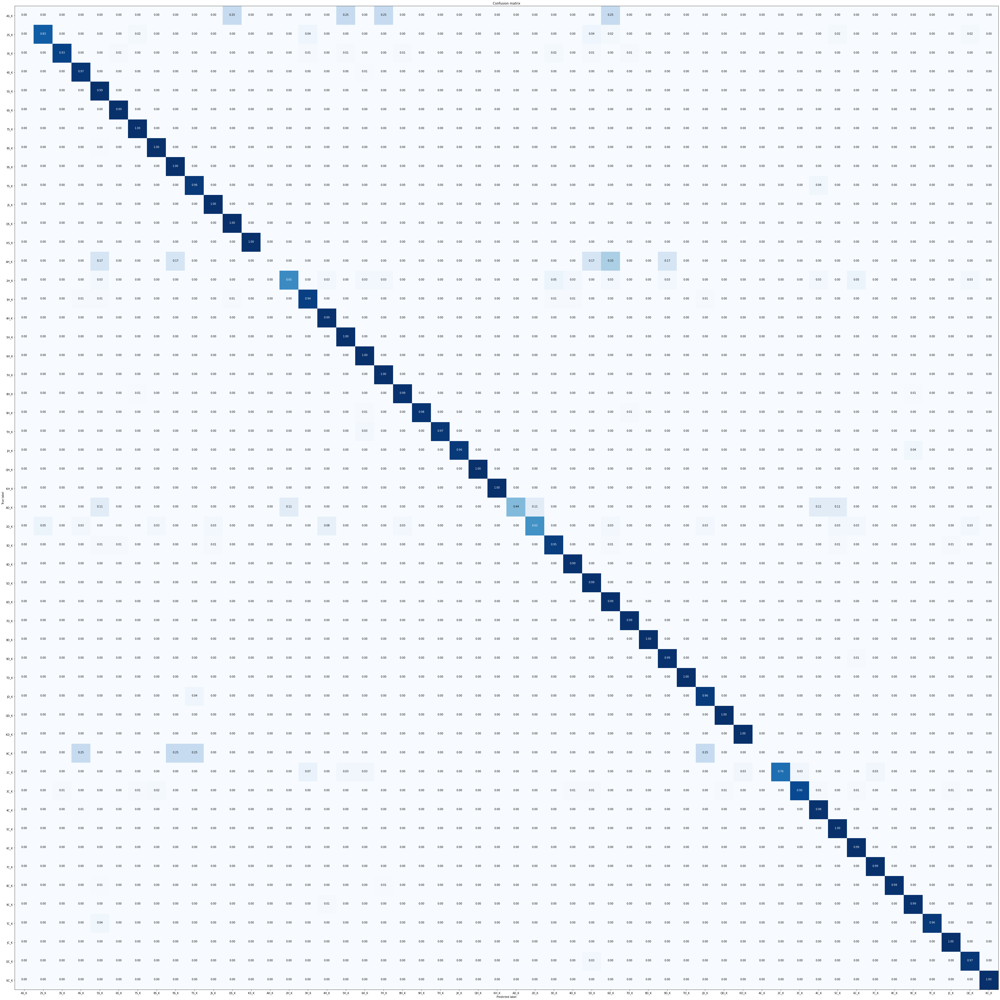

Confusion matrix, without normalization


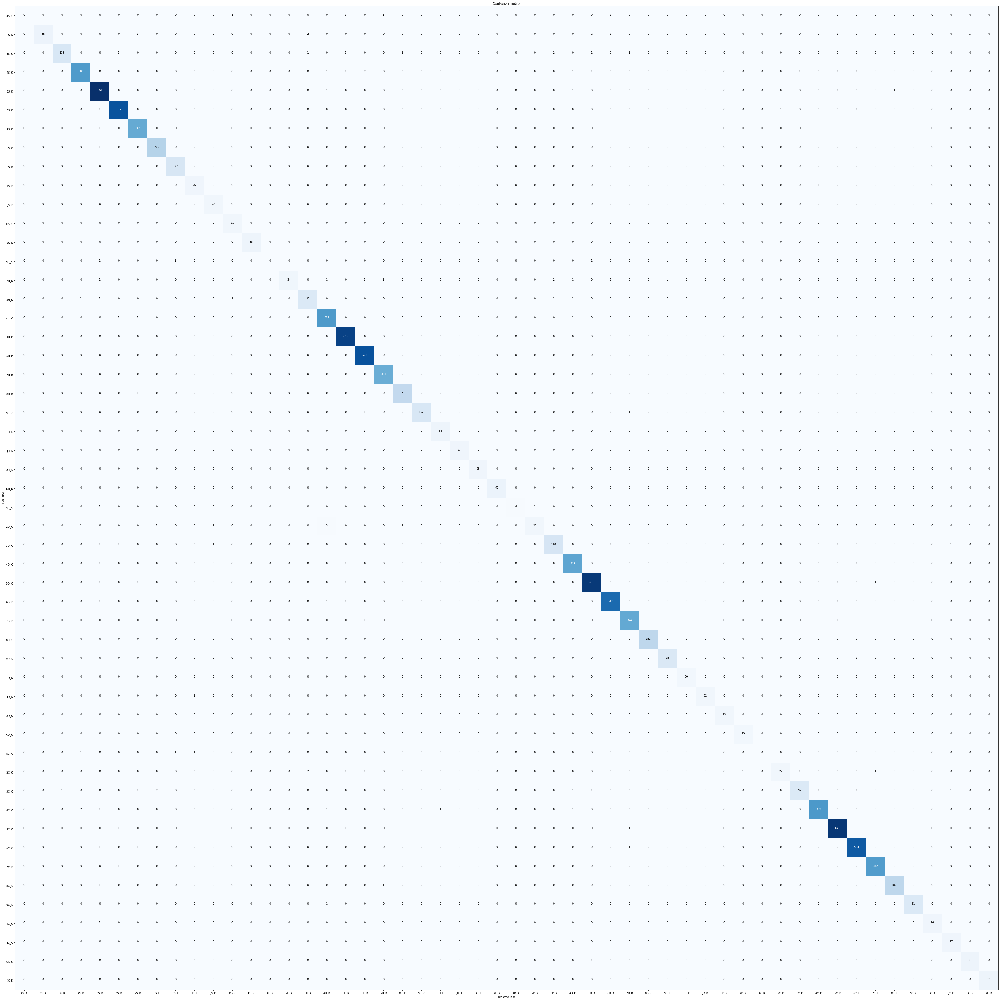

In [48]:
plot_cm(plot_pth, classes, model, test_loader_2k, device, numGames=currGames)

###### max validation accuracy

Accuracy: 98.40
Normalized confusion matrix


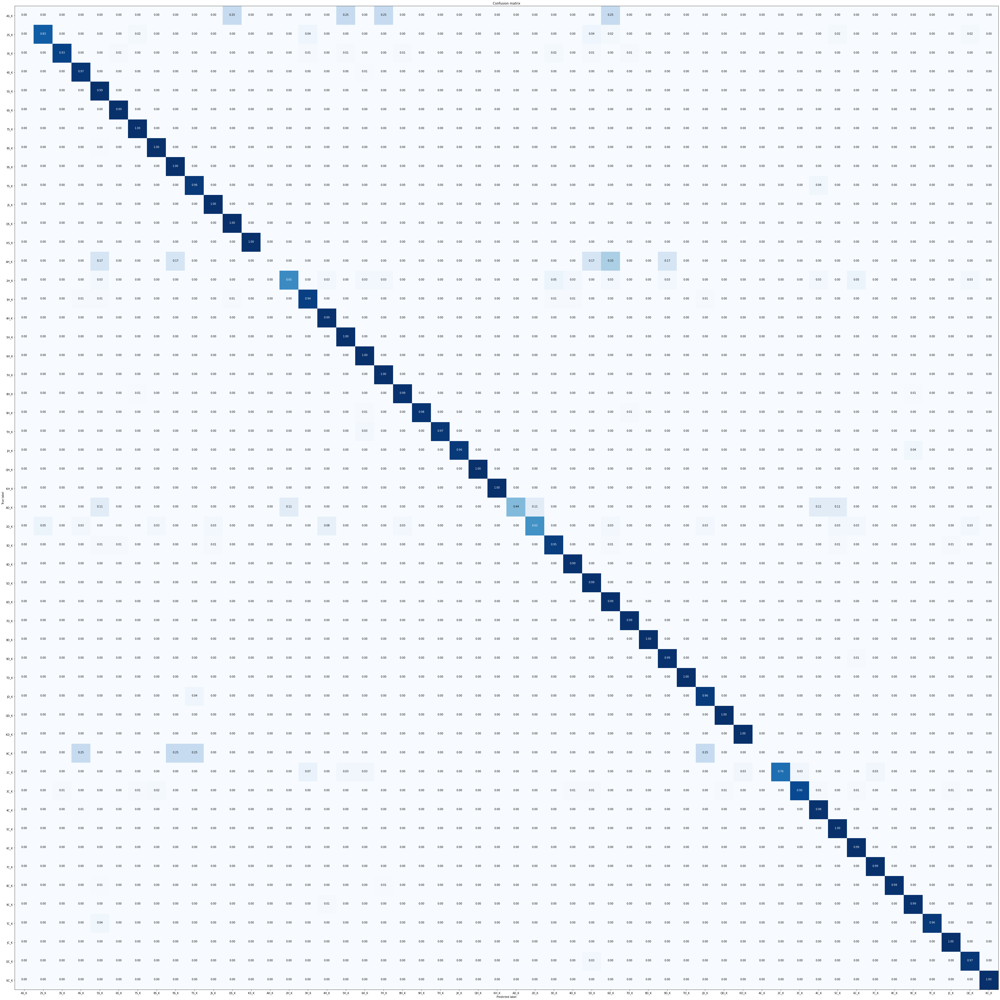

Confusion matrix, without normalization


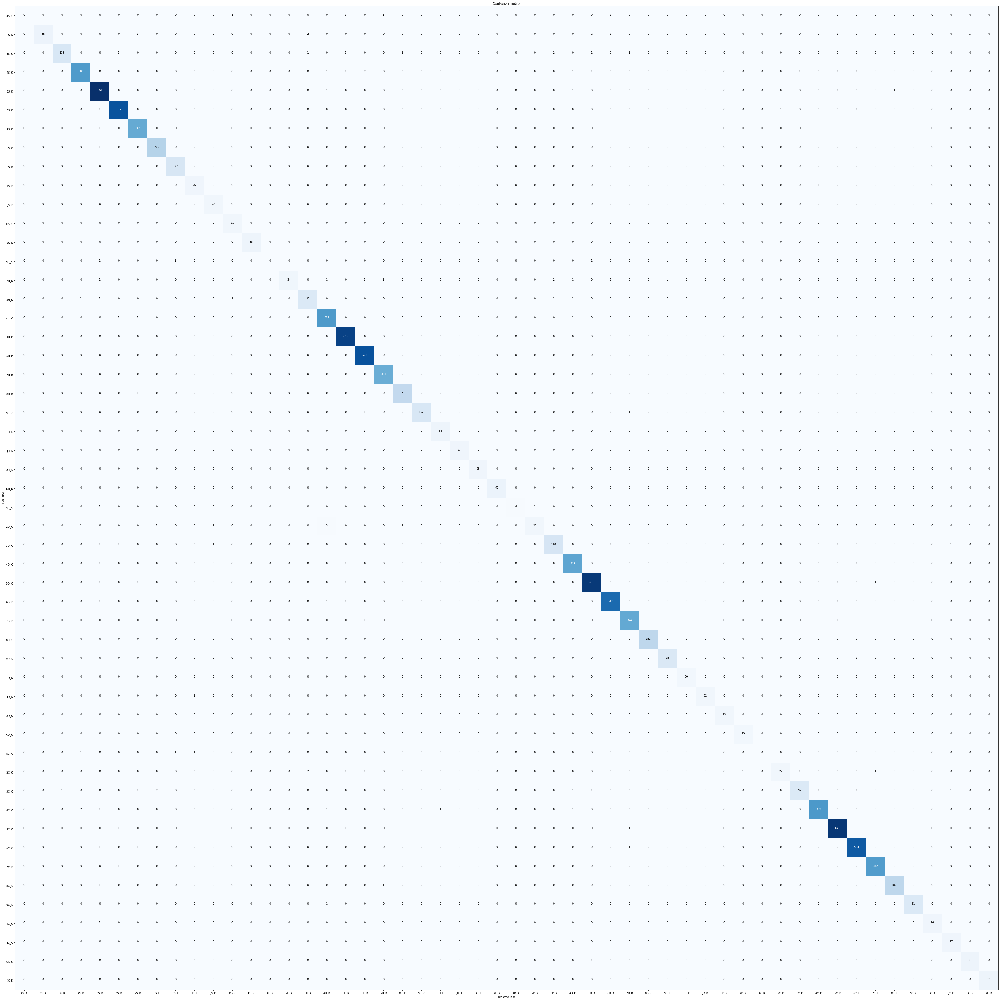

In [49]:
plot_cm(plot_pth, classes, model_acc, test_loader_2k, device, numGames=currGames, mode='acc')

###### min validation loss

Accuracy: 98.40
Normalized confusion matrix


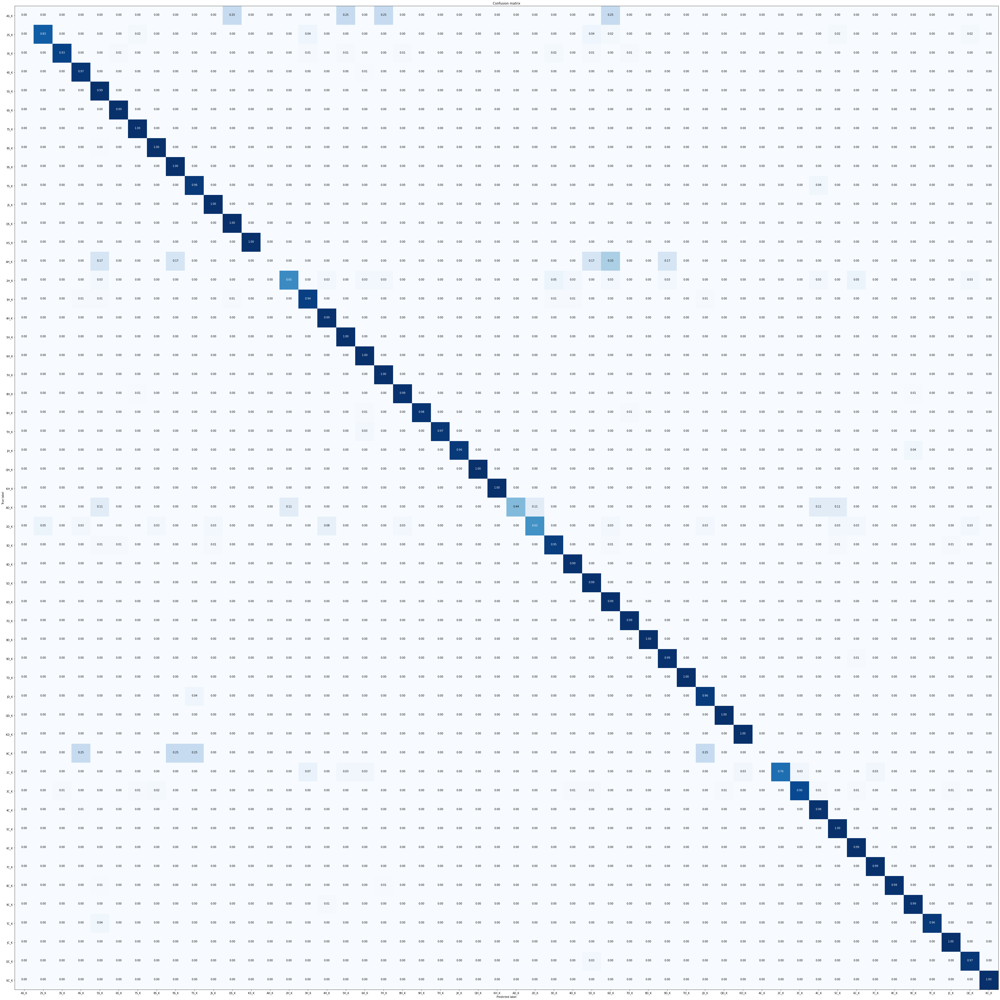

Confusion matrix, without normalization


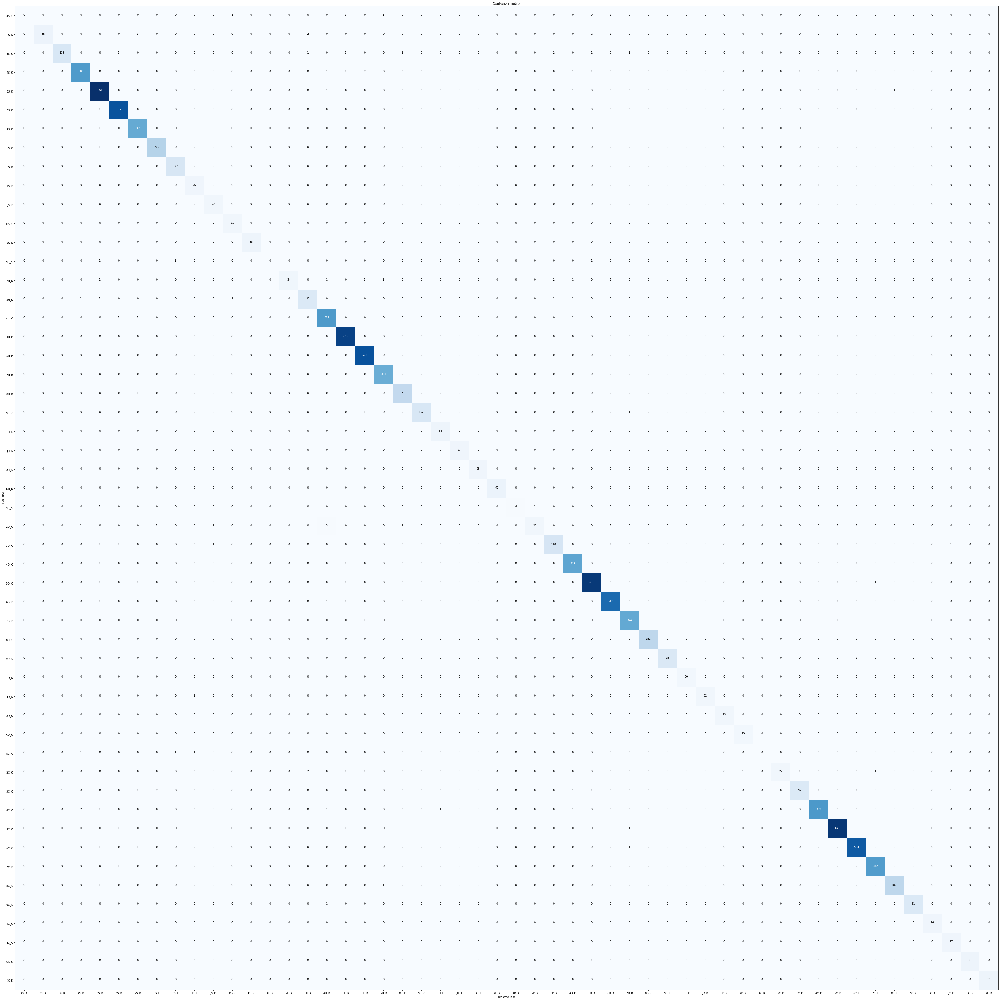

In [50]:
plot_cm(plot_pth, classes, model_loss, test_loader_2k, device, numGames=currGames, mode='loss')